## APLICACIÓN DE TÉCNICAS DE MINERÍA DE DATOS

### ÍÑIGO RUIZ MARTÍNEZ - FEBRERO/MARZO 2023


# Ejercicio 1

Con el conjunto de datos “FEV_data.csv”, información en fev.doc (live.com), que se encuentra en la carpeta de datos de la documentación, y sabiendo que la variable objetivo es ‘fev’, se pide:
- 1- Reporte descriptivo de los datos. Dimensiones del dataset, número de
variables continuas y categóricas. Distribuciones. Comentarios generales.
- 2- Decide si se descarta de inicio alguna de las variables de cara al modelado.
- 3- Ajusta el mejor modelo de regresión lineal con variables originales y sin
interacciones entre las variables.
- 4- Ajusta el mejor modelo de regresión lineal con variables originales y con
interacciones entre las variables que resulten relevantes.
- 5- Comparación de ambos modelos por validación cruza

Leemos el dataset y mostramos en el encabezado:

In [ ]:
import pandas as pd
import numpy as np
pd.set_option("display.max_rows", None, "display.max_columns", None)

# Lectura de datos
data = pd.read_csv(
    'C:\\Users\\ruizi\\Documents\\ÍÑIGO\\MÁSTER BIG DATA UCM\\7. Minería de datos y modelización predictiva\\Datos\\FEV_data.csv')
data.head()


,seqnbr,subjid,age,fev,height,sex,smoke
0,1,301,9,1.708,57.0,2,2
1,2,451,8,1.724,67.5,2,2
2,3,501,7,1.720,54.5,2,2
3,4,642,9,1.558,53.0,1,2
4,5,901,9,1.895,57.0,1,2


Obtenemos un summary de los tipos de variables almacenadas en el dataset:

In [ ]:
# Información del dataset
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   seqnbr  654 non-null    int64  
 1   subjid  654 non-null    int64  
 2   age     654 non-null    int64  
 3   fev     654 non-null    float64
 4   height  654 non-null    float64
 5   sex     654 non-null    int64  
 6   smoke   654 non-null    int64  
dtypes: float64(2), int64(5)
memory usage: 35.9 KB


Obtenemos el número de valores distintos por cada variable para evaluar cúales deberían ser factores:

In [ ]:
# Número de valores distintos por variable
data.nunique()


seqnbr    654
subjid    654
age        17
fev       575
height     56
sex         2
smoke       2
dtype: int64

### Reporte descriptivo de los datos

- Descripción del dataset: incluye datos de 654 visitas clínicas de niños a los que se ha medido la FEV ("Forced Expiratory Volume" o Volúmen Espiratorio Forzado) con la intención de estudiar cómo afecta el hábito de fumar en niños y adolescentes a su capacidad pulmonar. Un FEV alto está asociado a una mejor función pulmonar.

- Dimesiones del dataset: consta de 654 filas y 7 columnas.

- Variables: posee 5 variables continuas (más de 10 valores distintos: seqnbr, subjid, age, fev, height) y 2 categorícas (sex, smoke).

- Descripción de las variables: seqnbr: nº de caso, subjid: nº de identificación de sujeto (único), age: edad en el momento de la medida (años), fev: volúmen espiratorio forzado (litros por segundo), height: altura en el momento de la medición (pulgadas), sex: género (1 = masculino, 2 = femenino), smoke: fumador (1 = sí, 2 = no).


Cambiamos las variables sex y smoke a tipo categórico:

In [ ]:
# Lista de columnas con menos de 10 valores distintos. Potenciales factores!
to_factor = list(data.loc[:,data.nunique() <= 10]);

# Podemos cambiar el tipo de todas ellas a factor de una vez
data[to_factor] = data[to_factor].astype('category')


Revisamos los cambios en el tipo de variable:



In [ ]:
# Número de valores distintos por variable
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   seqnbr  654 non-null    int64   
 1   subjid  654 non-null    int64   
 2   age     654 non-null    int64   
 3   fev     654 non-null    float64 
 4   height  654 non-null    float64 
 5   sex     654 non-null    category
 6   smoke   654 non-null    category
dtypes: category(2), float64(2), int64(3)
memory usage: 27.2 KB


Obtenemos la distribución de todas las variables, tanto contínuas como categóricas

In [ ]:
data.describe(include='all')

,seqnbr,subjid,age,fev,height,sex,smoke
count,654.00000,654.000000,654.000000,654.000000,654.000000,654.0,654.0
unique,NaN,NaN,NaN,NaN,NaN,2.0,2.0
top,NaN,NaN,NaN,NaN,NaN,1.0,2.0
freq,NaN,NaN,NaN,NaN,NaN,336.0,589.0
mean,327.50000,37169.571865,9.931193,2.636780,61.143578,NaN,NaN
std,188.93782,23690.860350,2.953935,0.867059,5.703513,NaN,NaN
min,1.00000,201.000000,3.000000,0.791000,46.000000,NaN,NaN
25%,164.25000,15811.000000,8.000000,1.981000,57.000000,NaN,NaN
50%,327.50000,36071.000000,10.000000,2.547500,61.500000,NaN,NaN
75%,490.75000,53638.500000,12.000000,3.118500,65.500000,NaN,NaN


Inspeccionamos gráficamente la distribución de FEV:

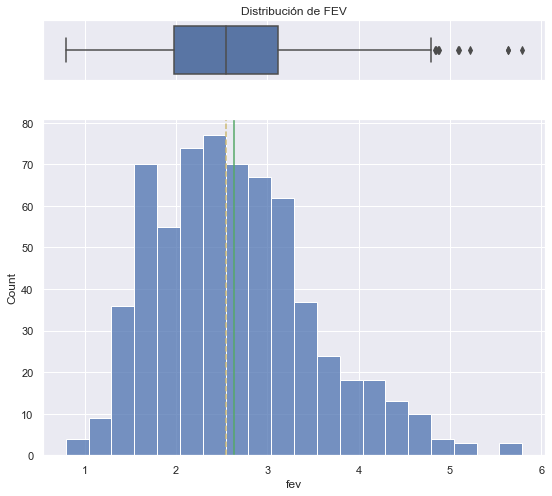

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import NuestrasFunciones as funciones

funciones.histogram_boxplot(data['fev'], bins = 20, font_scale=1, title="Distribución de FEV")


Barplot de 'smoke':


In [ ]:
funciones.cat_plot(data.smoke)


Integramos el proceso de representación en una sola función para obtener todos los histogramas de las variables contínuas que nos interesan: age, height y fev:

Cont


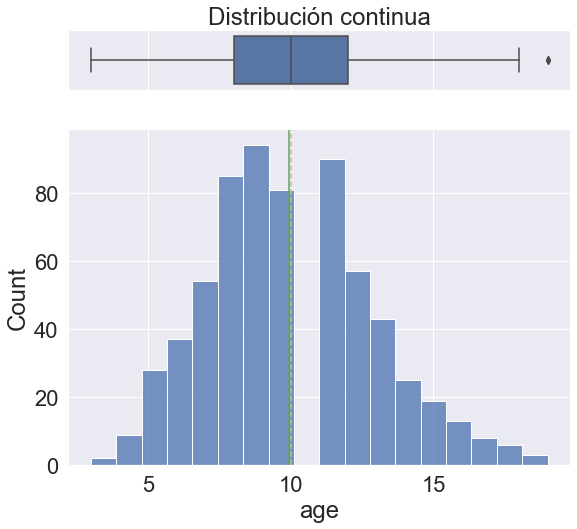

Cont


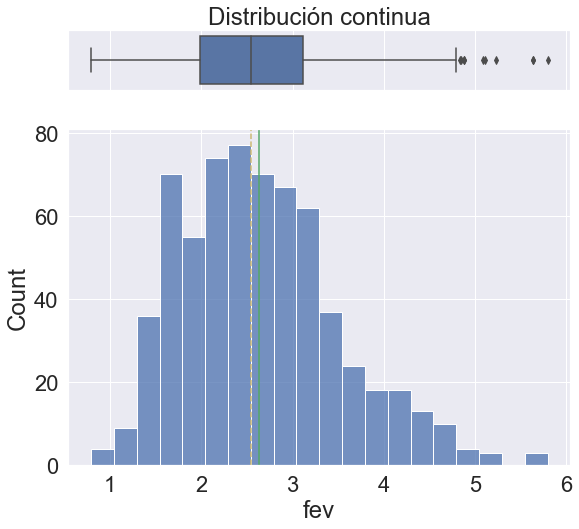

Cont


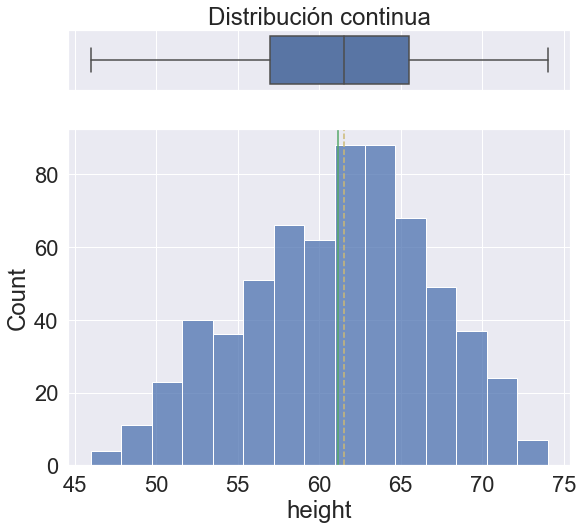

age       None
fev       None
height    None
dtype: object

In [ ]:
data.iloc[:,2:5].apply(funciones.plot)


Realizamos un primer estudio descriptivo de relaciones con la respuesta:

In [ ]:
data['log_fev'] = np.log(data.fev)

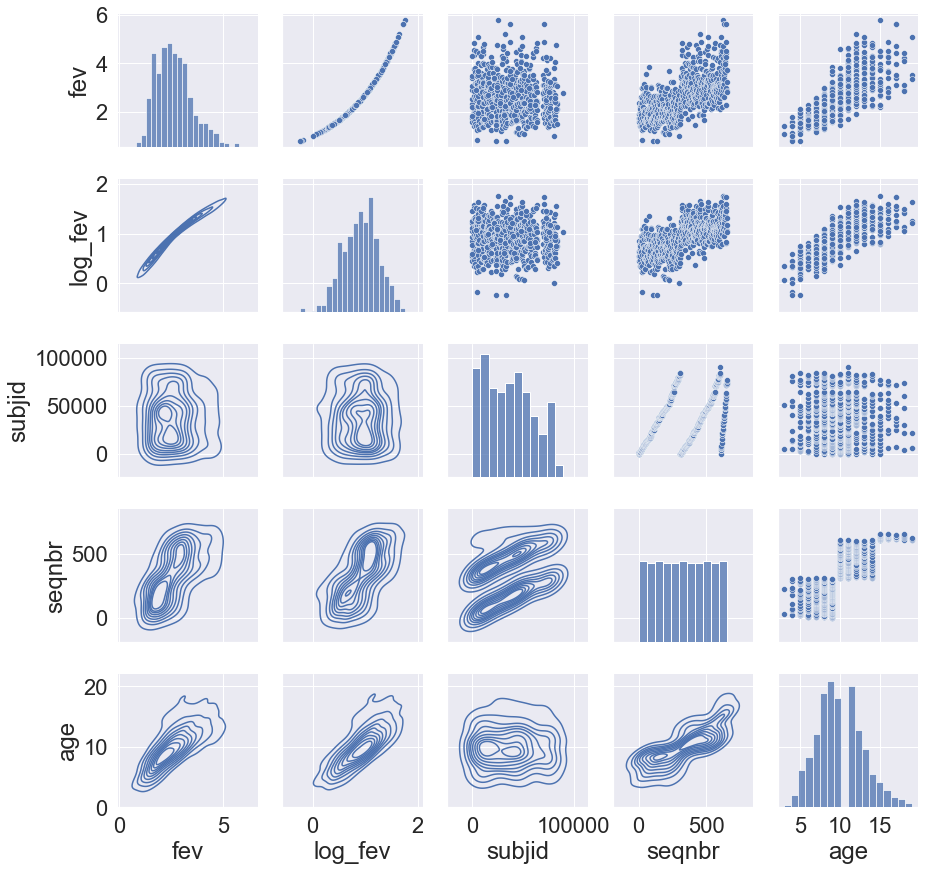

In [ ]:
import seaborn as sns

g = sns.PairGrid(data[['fev', 'log_fev', 'subjid', 'seqnbr', 'age', 'sex', 'smoke']])
g.map_diag(sns.histplot)
g.map_lower(sns.kdeplot)
g.map_upper(sns.scatterplot)
g.add_legend()

# del g

Generamos dos variables aleatorias que nos servirán como control para el futuro:

In [ ]:
data['aleatorio'] = np.random.uniform(0,1,size=data.shape[0])
data['aleatorio2'] = np.random.uniform(0,1,size=data.shape[0])
data.head()

,seqnbr,subjid,age,fev,height,sex,smoke,log_fev,aleatorio,aleatorio2
0,1,301,9,1.708,57.0,2,2,0.535323,0.736292,0.384850
1,2,451,8,1.724,67.5,2,2,0.544647,0.744068,0.984606
2,3,501,7,1.720,54.5,2,2,0.542324,0.195264,0.962694
3,4,642,9,1.558,53.0,1,2,0.443403,0.150995,0.072345
4,5,901,9,1.895,57.0,1,2,0.639219,0.050341,0.799932


Con pandas profilling podemos observar varias estadísticas interesantes así como un análisis exhaustivo de las relaciones entre todas las varibles y otros parámetros interesantes:

In [ ]:
import pandas_profiling
pandas_profiling.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Podemos confirmar que no tenemos valores perdidos en nuestro dataset por lo tanto no es necesario depurar en este sentido.
Otras conclusiones que podemos sacar de este primer estudio es que nuestra variable objetivo fev está altamente correlacionada con sqnbr, height y age.

Elimino las variables objetivo contínuas fev y log_fev, además también eliminamos subjid ya que vamos a trabajar con modelos de predicción y no va a generar ningún patrón porque se trata de un simple identificador unipersonal de los individuos del estudio.

In [ ]:
# Eliminar variable objetivo continua
varObjCont = data.fev
varObjCont_log = data.log_fev
imput = data.drop(['fev','log_fev','subjid'],axis=1)
varObjCont.info()

<class 'pandas.core.series.Series'>
RangeIndex: 654 entries, 0 to 653
Series name: fev
Non-Null Count  Dtype  
--------------  -----  
654 non-null    float64
dtypes: float64(1)
memory usage: 5.2 KB


Evaluamos las relaciones de todas las variables del imput frente a la variable objetivo, y ordenamos esos efectos por intensidad de asociación para generar un ranking de las variables más interesantes a nivel individual.

In [ ]:
import scipy.stats as stats

tablaCramer = pd.DataFrame(imput.apply(lambda x: funciones.cramers_v(x,varObjCont)),columns=['VCramer'])
tablaCramer

,VCramer
seqnbr,0.309540
age,0.437329
height,0.539096
sex,0.315734
smoke,0.257104
aleatorio,0.100290
aleatorio2,0.086460


In [ ]:
# Obtener el gráfico de importancia de las variables frente a la objetivo continua según vcramer
import plotly.express as px
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente al FEV').update_yaxes(categoryorder="total ascending")

Según el ranking de las variables según cramer en relación a la variable objetivo contínua, *height* y *age* son las que mayor relación presentan, es decir, las que mayor patrón de asociación pueden aportar para el futuro modelo, seguidas de *sex* y *seqnbr* y finalmente *smoke*.

Exploramos visualmente las relaciones, observando los cruces de las variables categóricas de sex y smoke con fev. Ambas presentan indicios de asociación con la objetivo puesto que tienen distribuciones que se situan en rangos distintos de fev.

<AxesSubplot:xlabel='sex', ylabel='fev'>

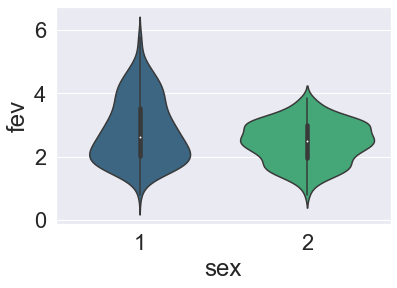

In [ ]:
sns.violinplot(x='sex',y='fev',data=data,palette='viridis')


Puede tener sentido que sex=1 que se corresponde con los hombres tengan mayor fev por simple anatomía humana.

<AxesSubplot:xlabel='smoke', ylabel='fev'>

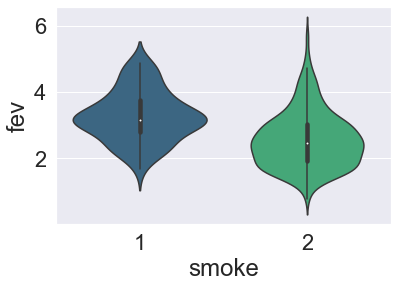

In [ ]:
sns.violinplot(x='smoke',y='fev',data=data,palette='viridis')


Sin embargo choca que los no fumadores smoke=2, tengan algo menos de fev que los fumadores. Lo que nos hace pensar que el fumar puede que afecte a los pulmones a medio-largo plazo. Aunque habría que relacionarlo con la edad y el sexo entre otras variables ya que es un efecto marginal y por si sola puede no ser indicativa. Así como seqnbr que a priori tampoco debería de tener importancia en el estudio al tratarse de un indicador de cada número de caso.

Generamos la matriz de correlaciones:

In [ ]:
# Matriz de correlaciones
corr = data.corr()
corr.style.background_gradient(cmap='coolwarm').format(precision=3)
#sns.heatmap(corr, annot=True)

,seqnbr,subjid,age,fev,height,log_fev,aleatorio,aleatorio2
seqnbr,1.000,0.406,0.783,0.616,0.632,0.624,0.075,0.018
subjid,0.406,1.000,-0.011,-0.015,-0.032,-0.007,0.062,-0.021
age,0.783,-0.011,1.000,0.756,0.792,0.772,0.043,0.037
fev,0.616,-0.015,0.756,1.000,0.868,0.977,0.122,0.036
height,0.632,-0.032,0.792,0.868,1.000,0.892,0.078,0.029
log_fev,0.624,-0.007,0.772,0.977,0.892,1.000,0.118,0.035
aleatorio,0.075,0.062,0.043,0.122,0.078,0.118,1.000,-0.036
aleatorio2,0.018,-0.021,0.037,0.036,0.029,0.035,-0.036,1.000


### Modelos de regresión lineal

Generamos las particiones training-test, eligiendo como variable objetivo continua el log de fev, ya que en primer lugar he realizado la prueba con fev unicamente pero su r cuadrado es menor.

In [ ]:
# Función necesaria
from sklearn.model_selection import train_test_split

# Creamos 4 objetos: predictores para tr y tst y variable objetivo para tr y tst.
X_train, X_test, y_train, y_test = train_test_split(imput, varObjCont_log, test_size=0.2, random_state=42)

# Comprobamos dimensiones
print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)


Training dataset shape: (523, 7) (523,)
Testing dataset shape: (131, 7) (131,)


Generamos el training con la objetivo dentro y vemos qué pinta tiene:

In [ ]:
# Genero el training con la objetivo dentro
data_train = X_train.join(y_train)
data_train.head()


,seqnbr,age,height,sex,smoke,aleatorio,aleatorio2,log_fev
321,322,12,71.0,1,2,0.802051,0.459458,1.515127
456,457,12,68.0,1,2,0.852502,0.439189,1.484101
340,341,10,62.0,1,2,0.358479,0.539692,0.661140
29,30,9,60.0,2,2,0.513300,0.654544,0.741937
570,571,10,65.0,1,2,0.348641,0.734109,1.128171


Obtenemos ahora la fórmula del modelo completo y el análisis de este modelo completo de referencia:

In [ ]:
# Aplicamos a fórmula de modelo completo
form=funciones.ols_formula(data_train,'log_fev')
form

'log_fev ~ seqnbr + age + height + sex + smoke + aleatorio + aleatorio2'

In [ ]:
from statsmodels.formula.api import ols
# Ajusto regresión según fórmula completa
modeloC = ols(form,data=data_train).fit()
modeloC.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                log_fev   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.800
Method:                 Least Squares   F-statistic:                     299.6
Date:                Wed, 15 Mar 2023   Prob (F-statistic):          4.71e-177
Time:                        11:34:04   Log-Likelihood:                 262.90
No. Observations:                 523   AIC:                            -509.8
Df Residuals:                     515   BIC:                            -475.7
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.9361      0.097    -19.877      0.000      -2.127      -1.745
sex[T.2]      -0.0263      0.013     -1.975      0.049      -0.052      -0.000
smoke[T.2]     0.0394      0.024      1.668      0.096      -0.007       0.086
seqnbr      5.838e-05   5.59e-05      1.044      0.297   -5.14e-05       0.000
age            0.0209      0.005      4.347      0.000       0.011       0.030
height         0.0420      0.002     21.791      0.000       0.038       0.046
aleatorio      0.0499      0.022      2.270      0.024       0.007       0.093
aleatorio2     0.0021      0.022      0.095      0.925      -0.041       0.045
==============================================================================
Omnibus:                       30.816   Durbin-Watson:                   2.088
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               40.985
Skew:                          -0.496   Prob(JB):                     1.26e-09
Kurtosis:                       3.947   Cond. No.                     5.83e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.83e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

En este punto intentamos encontrar un modelo más sencillo y que su capacidad de predicción no disminuya con respecto a esta.
Hallamos la importancia de las variables en el modelo completo, generamos la matrices de diseño primero para ver el modelo completo incluyendo también las variables categóricas:

In [ ]:
import statsmodels.api as sm
import patsy

# Generamos las matrices de diseño según la fórmula de modelo completo
y, X = patsy.dmatrices(form, data_train, return_type='dataframe')

# Ahora podemos aplicar la función "oficial" de statmodels OLS (con formato y,X)
model=sm.OLS(y,X).fit()
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                log_fev   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.800
Method:                 Least Squares   F-statistic:                     299.6
Date:                Wed, 15 Mar 2023   Prob (F-statistic):          4.71e-177
Time:                        11:34:15   Log-Likelihood:                 262.90
No. Observations:                 523   AIC:                            -509.8
Df Residuals:                     515   BIC:                            -475.7
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.9361      0.097    -19.877      0.000      -2.127      -1.745
sex[T.2]      -0.0263      0.013     -1.975      0.049      -0.052      -0.000
smoke[T.2]     0.0394      0.024      1.668      0.096      -0.007       0.086
seqnbr      5.838e-05   5.59e-05      1.044      0.297   -5.14e-05       0.000
age            0.0209      0.005      4.347      0.000       0.011       0.030
height         0.0420      0.002     21.791      0.000       0.038       0.046
aleatorio      0.0499      0.022      2.270      0.024       0.007       0.093
aleatorio2     0.0021      0.022      0.095      0.925      -0.041       0.045
==============================================================================
Omnibus:                       30.816   Durbin-Watson:                   2.088
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               40.985
Skew:                          -0.496   Prob(JB):                     1.26e-09
Kurtosis:                       3.947   Cond. No.                     5.83e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.83e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
from relativeImp import relativeImp

# Nombres de predictores (en modo dummy) donde quitamos la constante
names=X.columns.tolist()[1:]

# Calculamos importancia relativa
df_results = relativeImp(X.join(y), outcomeName = 'log_fev', driverNames = names)

# Ordenamos valores
df_results.sort_values(by='normRelaImpt', ascending=False)


,driver,rawRelaImpt,normRelaImpt
4,height,0.416520,51.878751
3,age,0.224936,28.016443
2,seqnbr,0.126616,15.770350
1,smoke[T.2],0.015378,1.915409
0,sex[T.2],0.013593,1.693002
5,aleatorio,0.005618,0.699727
6,aleatorio2,0.000211,0.026317


In [ ]:
# Gráfico de importancia relativa en base al R2
px.bar(df_results,x='normRelaImpt',y='driver',title='Importancia relativa por aportación al R2').update_yaxes(categoryorder="total ascending").show()


A partir de aquí podemos hacer un proceso "backward" eliminando poco a poco las variables de menor importancia:

In [ ]:
# Proceso backward de eliminación de efectos según p-valor
form2=funciones.ols_formula(data_train,'log_fev', 'aleatorio','aleatorio2', 'seqnbr', 'smoke')

# Ajusto regresión sin prop_missings
modeloC2 = ols(form2,data=data_train).fit()
modeloC2.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                log_fev   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     688.9
Date:                Wed, 15 Mar 2023   Prob (F-statistic):          1.73e-180
Time:                        11:34:26   Log-Likelihood:                 258.17
No. Observations:                 523   AIC:                            -508.3
Df Residuals:                     519   BIC:                            -491.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.8907      0.093    -20.384      0.000      -2.073      -1.708
sex[T.2]      -0.0277      0.013     -2.082      0.038      -0.054      -0.002
age            0.0218      0.004      5.721      0.000       0.014       0.029
height         0.0425      0.002     21.967      0.000       0.039       0.046
==============================================================================
Omnibus:                       32.280   Durbin-Watson:                   2.097
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.581
Skew:                          -0.528   Prob(JB):                     9.35e-10
Kurtosis:                       3.891   Cond. No.                         892.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Evaluamos la capacidad de la partición test para el modelo completo y para nuestro modelo ajustado:

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Predicciones para test modelo completo
data_y_pred = modeloC.predict(X_test)

# Cálculo de performance
print("Root Mean squared error: %.2f" % np.sqrt(mean_squared_error(y_test, data_y_pred)))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, data_y_pred))

# Gráfico de real frente a prediccion para alguna variable
#plt.scatter(X_test.Acidez, y_test, color="black")
#plt.scatter(X_test.Acidez, vinos_y_pred, color="blue")


Root Mean squared error: 0.13
Coefficient of determination: 0.85


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Predicciones para test modelo C2
data_y_pred = modeloC2.predict(X_test)

# Cálculo de performance
print("Mean squared error: %.2f" % np.sqrt(mean_squared_error(y_test, data_y_pred)))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, data_y_pred))

# Gráfico de real frente a prediccion para alguna variable
#plt.scatter(X_test.Acidez, y_test, color="black")
#plt.scatter(X_test.Acidez, vinos_y_pred, color="blue")

Mean squared error: 0.14
Coefficient of determination: 0.84


Coeficiente de determinación R2: 0.792 (0.034)


<AxesSubplot:>

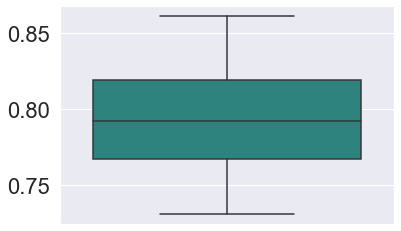

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import LinearRegression

model = LinearRegression()
#model = sm.OLS(y,X)

# Establecemos esquema de validación fijando random_state (reproducibilidad)
cv = RepeatedKFold(n_splits=5, n_repeats=20, random_state=12345)

# Obtenemos los resultados de R2 para cada partición tr-tst
scores = cross_val_score(model, X, y, cv=cv)

# Sesgo y varianza
print('Coeficiente de determinación R2: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

sns.boxplot(y=scores,palette='viridis')

Coeficiente de determinación R2 Modelo Final Backward: 0.804 (0.030)


<AxesSubplot:>

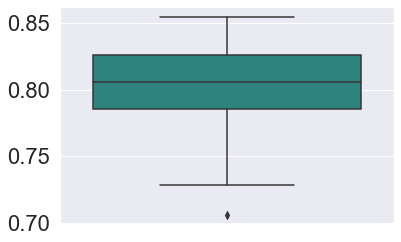

In [ ]:
# Generamos las matrices de diseño según la fórmula de modelo completo
y2, X2 = patsy.dmatrices(form2, data, return_type='dataframe')

# Obtenemos los resultados de R2 para cada partición tr-tst
scores = cross_val_score(model, X2, y2, cv=cv)

# Sesgo y varianza
print('Coeficiente de determinación R2 Modelo Final Backward: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

sns.boxplot(y=scores,palette='viridis')

Podemos probar por ejemplo el modelo con la interacción Smoke-Sex, sube un pelin el r2 pero a costa de aumentar demasiado el número de variables y muchas de ellas no son signficativas:

In [ ]:
form3 = 'log_fev ~ height + age + smoke*sex'

# Ajusto regresión sin prop_missings
modeloC3 = ols(form3,data=data_train).fit()
modeloC3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                log_fev   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.798
Method:                 Least Squares   F-statistic:                     414.7
Date:                Wed, 15 Mar 2023   Prob (F-statistic):          2.72e-178
Time:                        11:34:47   Log-Likelihood:                 259.66
No. Observations:                 523   AIC:                            -507.3
Df Residuals:                     517   BIC:                            -481.8
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              -1.9231      0.101    -18.978      0.000      -2.122      -1.724
smoke[T.2]              0.0284      0.036      0.798      0.425      -0.042       0.098
sex[T.2]               -0.0427      0.043     -1.003      0.316      -0.127       0.041
smoke[T.2]:sex[T.2]     0.0184      0.044      0.413      0.679      -0.069       0.106
height                  0.0423      0.002     21.794      0.000       0.038       0.046
age                     0.0237      0.004      5.979      0.000       0.016       0.032
==============================================================================
Omnibus:                       28.858   Durbin-Watson:                   2.086
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               36.641
Skew:                          -0.490   Prob(JB):                     1.11e-08
Kurtosis:                       3.849   Cond. No.                     1.02e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.02e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Coeficiente de determinación R2 Modelo Final Backward: 0.803 (0.030)


<AxesSubplot:>

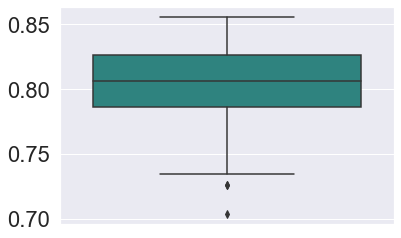

In [ ]:
# Generamos las matrices de diseño según la fórmula de modelo completo
y3, X3 = patsy.dmatrices(form3, data, return_type='dataframe')

# Obtenemos los resultados de R2 para cada partición tr-tst
scores = cross_val_score(model, X3, y3, cv=cv)

# Sesgo y varianza
print('Coeficiente de determinación R2 Modelo Final Backward: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

sns.boxplot(y=scores,palette='viridis')

In [ ]:
form4 = 'log_fev ~ height + age + seqnbr + smoke + sex + subjid'
form5 = 'log_fev ~ height + age + seqnbr + smoke + sex'
form6 = 'log_fev ~ height + age + seqnbr + smoke*sex'
form7 = 'log_fev ~ height + age + smoke + sex'


# Creamos lista de fórmulas
list_form = [form,form2,form3,form4,form5,form6,form7]
list_form

# Aplicamos a toda la lista la función creada (devuelve un dataframe pero está transpuesto)
list_res = pd.DataFrame(map(lambda x: funciones.cross_val_lin(x, data, seed=2022),list_form))

# Trasnponer dataframe y pasar de wide a long (creando un factor variable con el nombre de cada fórmula de la lista[0,1,2,3])
results = list_res.T.melt()
results.columns = ['Modelo','R2']
results.head()


Modelo: log_fev ~ seqnbr + age + height + sex + smoke + aleatorio + aleatorio2
Coeficiente de determinación R2: 0.805 (0.030)
Modelo: log_fev ~ age + height + sex
Coeficiente de determinación R2: 0.803 (0.029)
Modelo: log_fev ~ height + age + smoke*sex
Coeficiente de determinación R2: 0.803 (0.030)
Modelo: log_fev ~ height + age + seqnbr + smoke + sex + subjid
Coeficiente de determinación R2: 0.803 (0.029)
Modelo: log_fev ~ height + age + seqnbr + smoke + sex
Coeficiente de determinación R2: 0.803 (0.029)
Modelo: log_fev ~ height + age + seqnbr + smoke*sex
Coeficiente de determinación R2: 0.803 (0.029)
Modelo: log_fev ~ height + age + smoke + sex
Coeficiente de determinación R2: 0.804 (0.030)


,Modelo,R2
0,0,0.825561
1,0,0.771132
2,0,0.852877
3,0,0.777246
4,0,0.803612


<AxesSubplot:xlabel='Modelo', ylabel='R2'>

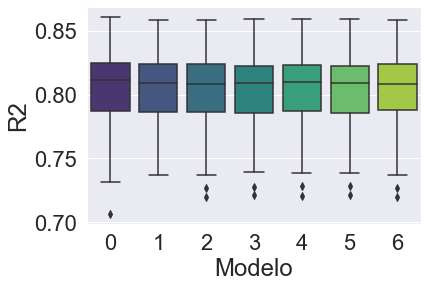

In [ ]:
# Boxplot paralelo para comparar
sns.boxplot(x='Modelo',y='R2',data=results,palette='viridis')


Hemos comparado varios modelos diferentes a través de validación cruzada.

Podemos completar que el mejor modelo con variables originales sin interacciones es el modelo de la fórmula 2: log_fev ~ age + height + sex que tiene solo 3 variables a parte de la objetivo, un coeficiente de determinación R2 de 0.803 y un error de 0.029. Además en el boxplot podemos observar que no tiene ningún outlier. Aunque también es buena elección el modelo de la fórmula 7: log_fev ~ height + age + smoke + sex puesto que su coeficiente de determinación R2 es ligeramente superior 0.804, aunque el error es ligeramente mayor: 0.030 y en el boxplot presenta dos outliers.

Respecto al mejor modelo con variables originales e interacciones entre ellas es el de la fórmula 3: log_fev ~ height + age + smoke*sex, pues es más sencillo que el otro modelo planteado con interacciones y posee un coeficiente de determinación R2: 0.803 (0.030).

#

#

# Ejercicio 2

Con los datos de la serie de “defunciones.xlsx” que se encuentra en la carpeta de datos de la documentación, se pretende ajustar el mejor modelo de series
temporales a cualquiera de las series allí contenidas (elige 1).
- 1- Lectura y representación de la serie. Descomposición. Conclusiones.
- 2- Partición training y test (los últimos 2 años de datos).
- 3- Mejor modelo de suavizado exponencial. ¿Pasa el test residual de Ljung.Box?
- 4- Mejor modelo ARIMA. ¿Pasa el test residual de Ljung.Box?
- 5- Comparación. En relación al MAPE en el conjunto de tets, ¿Qué modelo resulta
más preciso en sus predicciones?


In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import NuestrasFunciones as funciones
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [ ]:
# Lectura de datos
defunciones = pd.read_excel('C:\\Users\\ruizi\\Documents\\ÍÑIGO\\MÁSTER BIG DATA UCM\\7. Minería de datos y modelización predictiva\\Datos\\defunciones.xlsx')
defunciones.head()

,,Todas las causas,Tumores,Causas externas
0,1980M01,28681,4883,1277
1,1980M02,23906,4493,1122
2,1980M03,25275,4957,1244
3,1980M04,22500,4523,1214
4,1980M05,22781,4893,1228


In [ ]:
dates = pd.date_range(start='1980', periods=defunciones.shape[0], freq='MS')
dates

DatetimeIndex(['1980-01-01', '1980-02-01', '1980-03-01', '1980-04-01',
               '1980-05-01', '1980-06-01', '1980-07-01', '1980-08-01',
               '1980-09-01', '1980-10-01',
               ...
               '2018-03-01', '2018-04-01', '2018-05-01', '2018-06-01',
               '2018-07-01', '2018-08-01', '2018-09-01', '2018-10-01',
               '2018-11-01', '2018-12-01'],
              dtype='datetime64[ns]', length=468, freq='MS')

In [ ]:
# Convertir en serie temporal
defunciones.set_index(dates,inplace=True)
defunciones

,,Todas las causas,Tumores,Causas externas
1980-01-01,1980M01,28681,4883,1277
1980-02-01,1980M02,23906,4493,1122
1980-03-01,1980M03,25275,4957,1244
1980-04-01,1980M04,22500,4523,1214
1980-05-01,1980M05,22781,4893,1228
1980-06-01,1980M06,21495,4751,1171
1980-07-01,1980M07,22117,4958,1499
1980-08-01,1980M08,22735,4968,1567
1980-09-01,1980M09,21020,4796,1329
1980-10-01,1980M10,22852,5057,1302


In [ ]:
defunciones = defunciones.drop([' '],axis=1)
defunciones


,Todas las causas,Tumores,Causas externas
1980-01-01,28681,4883,1277
1980-02-01,23906,4493,1122
1980-03-01,25275,4957,1244
1980-04-01,22500,4523,1214
1980-05-01,22781,4893,1228
1980-06-01,21495,4751,1171
1980-07-01,22117,4958,1499
1980-08-01,22735,4968,1567
1980-09-01,21020,4796,1329
1980-10-01,22852,5057,1302


Decidimos estudiar la columna de Tumores:

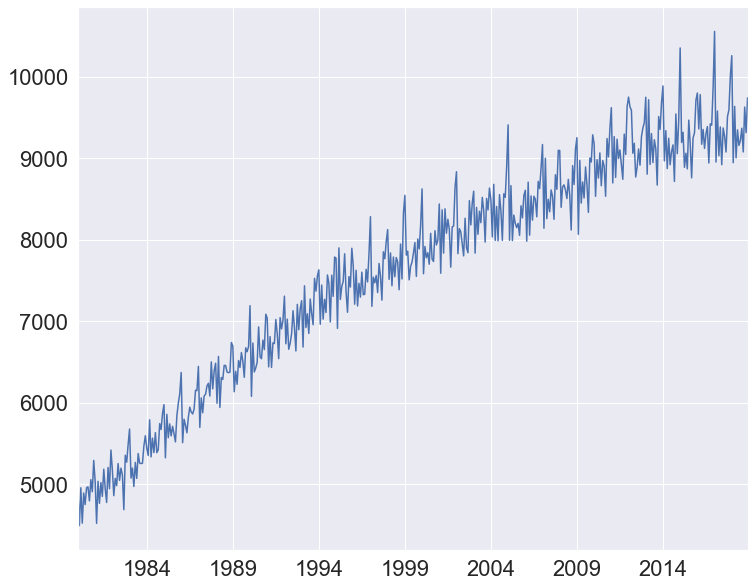

In [ ]:
plt.rcParams["figure.figsize"] = (12,10)
defunciones['Tumores'].plot()
plt.show()

Comprobamos si la serie al natural es estacionaria aplicando el Test de Dickey-Fuller, definimos la regresion 'ct' puesto que que con regresión 'c' nos sale que es estacionaria y no puede serlo, mayormente porque tiene tendencia que se ve a simple vista y porque segun el correlograma el decrecimiento es súper lento.

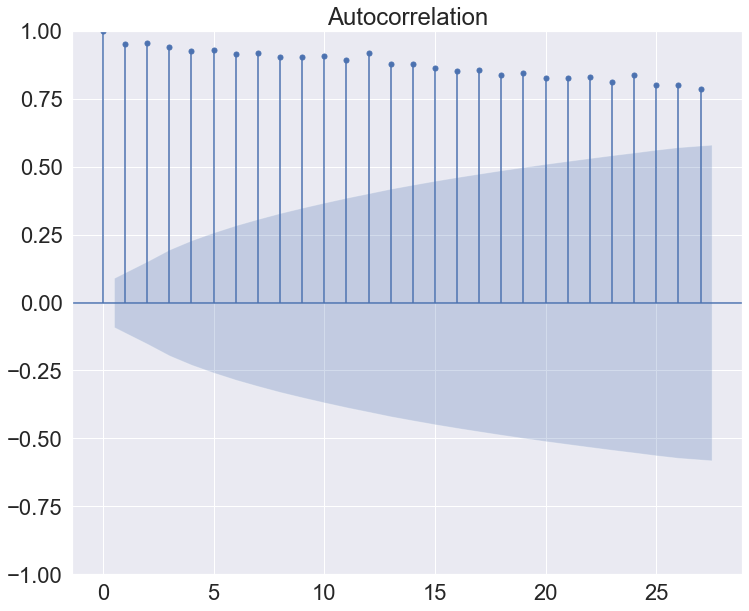

In [ ]:
plot_acf(defunciones['Tumores'].dropna(inplace=False))
plt.show()

In [ ]:
from statsmodels.tsa.stattools import adfuller

adfuller(defunciones['Tumores'], regression='ct')

(-0.37339991488461627,
 0.9876512459203965,
 11,
 456,
 {'1%': -3.9787614194731136,
  '5%': -3.4201620043878207,
  '10%': -3.1327392874680067},
 6017.453227012797)

Obtenemos que el p valor es significativamente mayor de 0.05 por lo tanto la hipótesis H1 de que la serie es estacionaria será rechazado. Además es algo que se podría apreciar a simple vista, ya que vemos claramente que la serie tiene tendencia. Vemos heteroelasticidad y quizá una componente estacional.

A partir de aquí vamos a intentar descomponer la serie de manera descriptiva:

Si tenemos heterocedasticidad en la serie, es decir si la influencia de las perturbaciones estacionales crecen con el tiempo, como podemos intuir que es el caso, lo más adecuado sería realizar la descomposición multiplicativa:

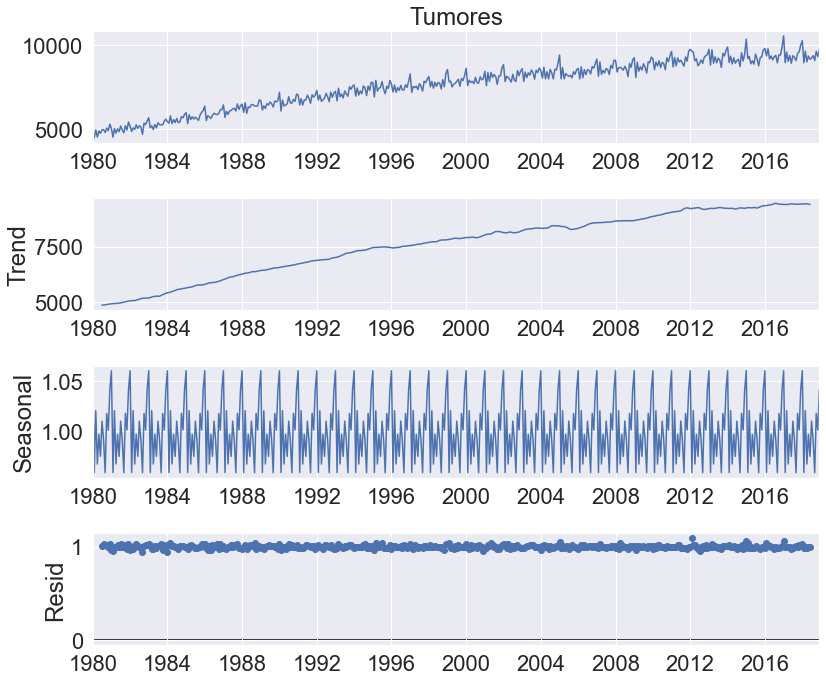

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
# Aplicar descomposición multiplicativa
defunciones_desc_Mul = seasonal_decompose(defunciones['Tumores'], model='multiplicative',period=12)
defunciones_desc_Mul.plot()
plt.show()

En la parte de estacionalidad vemos que como máximo aumenta y disminuye un 5% más o menos, no es una estacionalidad muy agresiva.

Evaluamos estacionariedad de los residuos de la descomposición Multiplicativa:

In [ ]:
funciones.test_stationarity(defunciones_desc_Mul.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -9.090168e+00
p-value                        3.843388e-15
#Lags Used                     1.700000e+01
Number of Observations Used    4.380000e+02
Critical Value (1%)           -3.445368e+00
Critical Value (5%)           -2.868161e+00
Critical Value (10%)          -2.570297e+00
dtype: float64


Su p valor es significativamente pequeño, por lo que podemos decir que es estacionaria.

Pintamos con seasonal_plot todos estos periodos de años en el mismo rango de meses, para ver cómo está variando esa fluctuación estacional a través del tiempo:

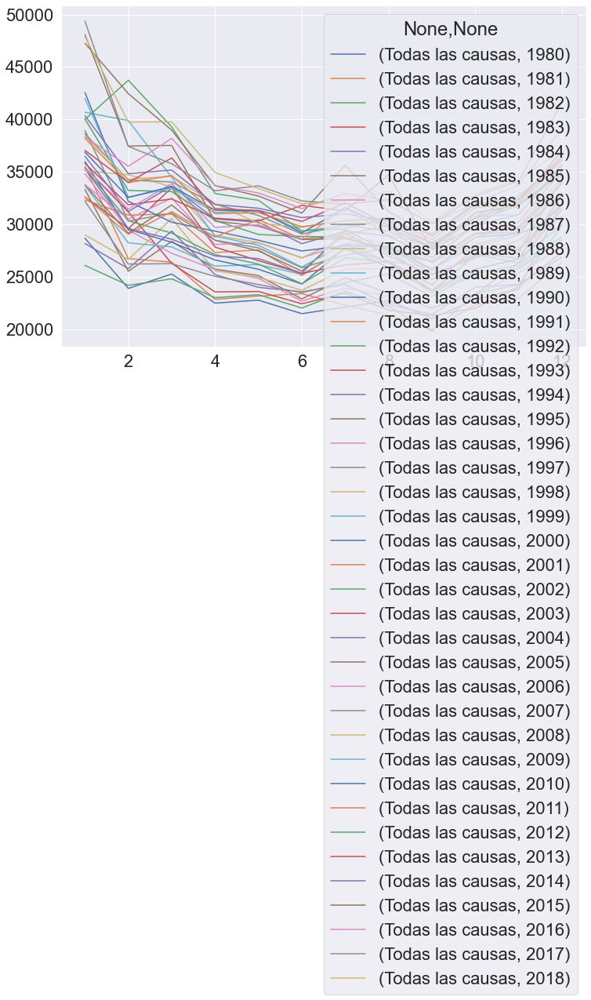

In [ ]:
funciones.seasonal_plot(defunciones)
plt.show()

Podemos apreciar que a mitad de año (junio-julio) se produce una bajada general. En la primera parte de los meses se observan más subidas que a finales.

### Hacia la estacionariedad
A partir de este punto, vamos a intentar de manera manual eliminar esas componentes a través de nuestro código para generar una serie residual y comprobar si es estacionaria una vez eliminados los efectos típicos de las series temporales.


Tomamos logaritmos de la serie, para intentar eliminar la heterocedasticidad y estabilizar la varianza:

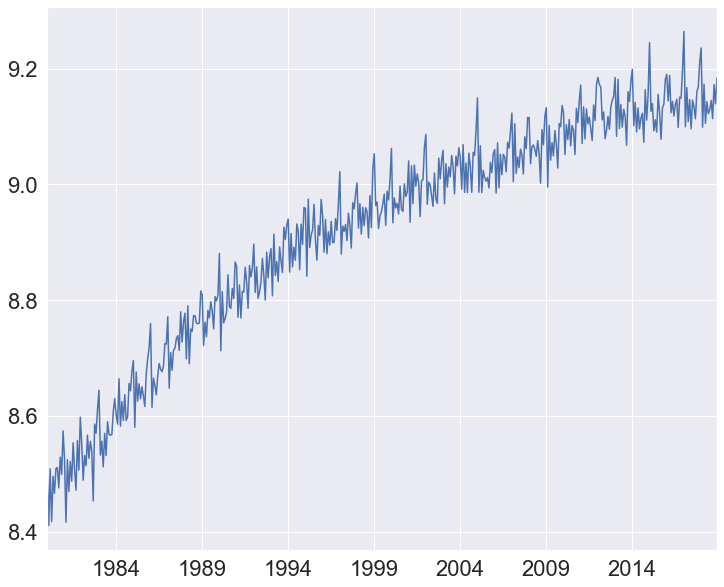

In [ ]:
defuncionesLog = np.log(defunciones['Tumores'])
defuncionesLog.plot()
plt.show()

Ahora vamos a hacer una diferenciación regular para eliminar la tendencia creciente de la serie:

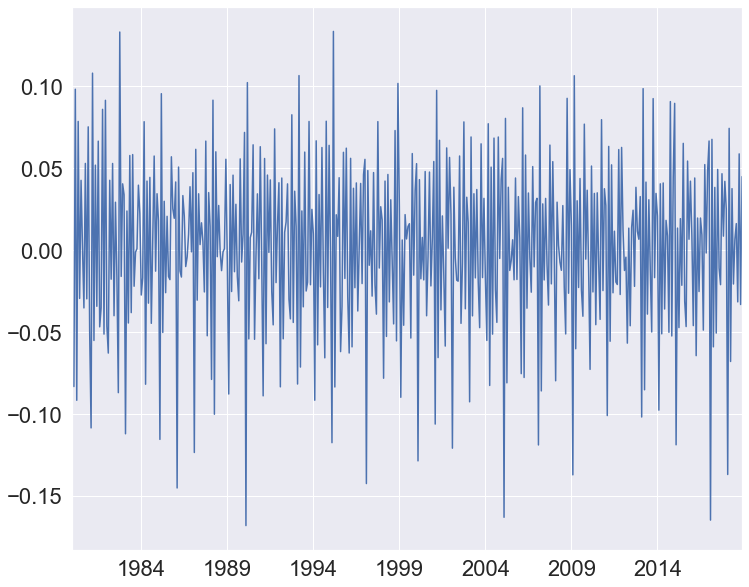

In [ ]:
defuncionesLog_diff_1 = defuncionesLog.diff(periods=1)
defuncionesLog_diff_1.plot()
plt.show()

Parece que hemos mejorado en el sentido de heterocedasticidad.

In [ ]:
funciones.test_stationarity(defuncionesLog_diff_1.dropna())

Results of Dickey-Fuller Test:
Test Statistic                  -4.319989
p-value                          0.000410
#Lags Used                      18.000000
Number of Observations Used    448.000000
Critical Value (1%)             -3.445031
Critical Value (5%)             -2.868013
Critical Value (10%)            -2.570218
dtype: float64


Con el test de Dickey-Fullero obtenemos un p valor por debajo de 0.5 que nos indica que es estacionaria, pero no es un valor muy bajo. Por lo tanto vamos a optar por diferenciar también en lo estacional:

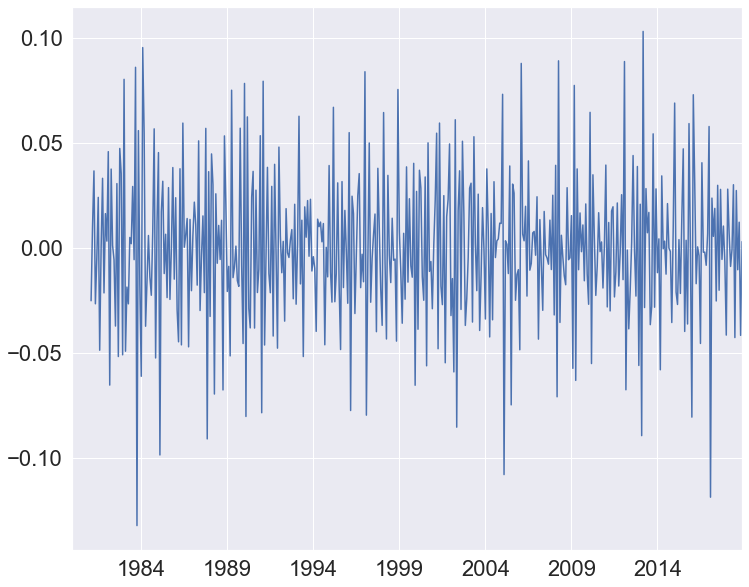

In [ ]:
defuncionesLog_diff_1_12 = defuncionesLog_diff_1.diff(periods=12)
defuncionesLog_diff_1_12.plot()
plt.show()

Comprobamos la estacionariedad pasando el Test de Dickey-Fuller a esta nueva serie diferenciada logarítmica:

In [ ]:
funciones.test_stationarity(defuncionesLog_diff_1_12.dropna(inplace=False))

Results of Dickey-Fuller Test:
Test Statistic                -1.000587e+01
p-value                        1.832186e-17
#Lags Used                     1.800000e+01
Number of Observations Used    4.360000e+02
Critical Value (1%)           -3.445438e+00
Critical Value (5%)           -2.868192e+00
Critical Value (10%)          -2.570313e+00
dtype: float64


p valor muchísimo más pequeño de 0.05 por lo que la serie es definitivamente estacionaria.

Estudiamos ahora las autocorrelaciones para identificar patrones ARIMA:

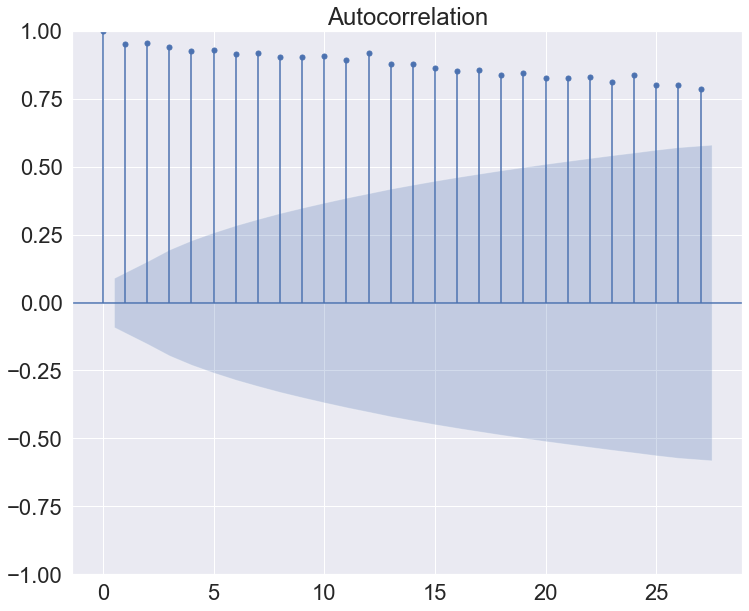

In [ ]:
plot_acf(defunciones['Tumores'].dropna(inplace=False))
plt.show()

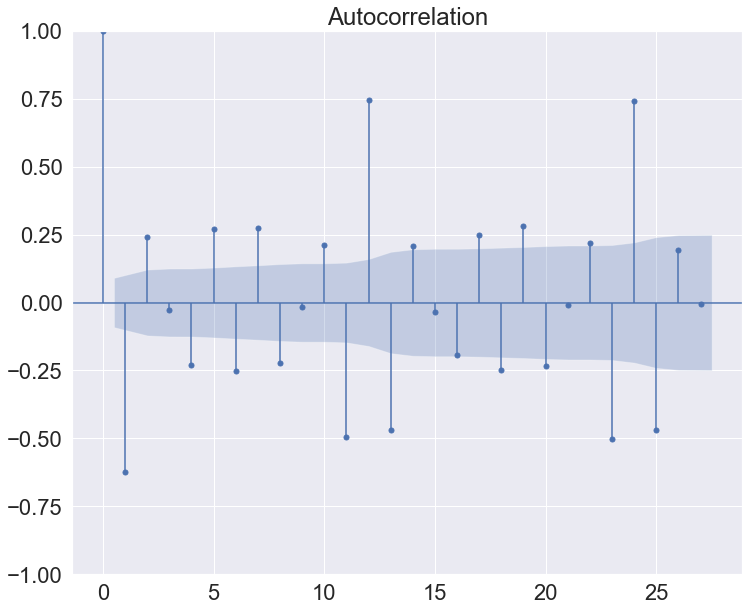

In [ ]:
plot_acf(defuncionesLog_diff_1.dropna(inplace=False))
plt.show()

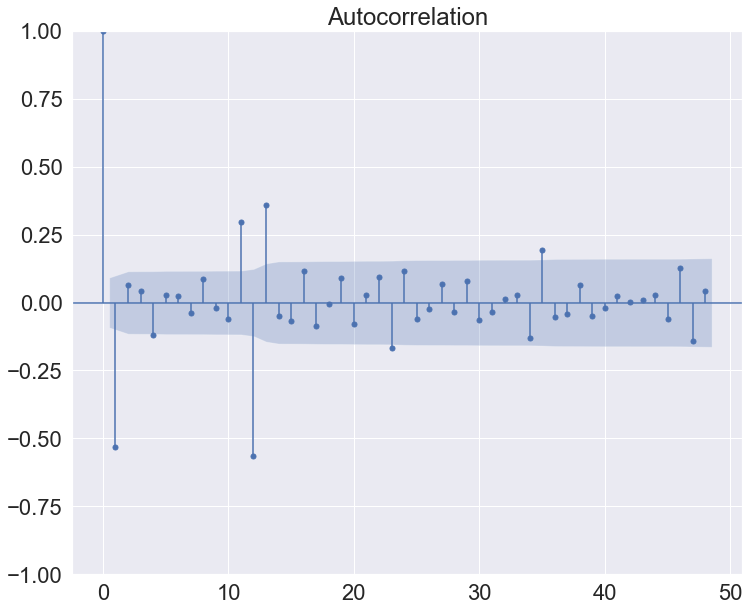

In [ ]:
plot_acf(defuncionesLog_diff_1_12.dropna(inplace=False), lags=48)
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



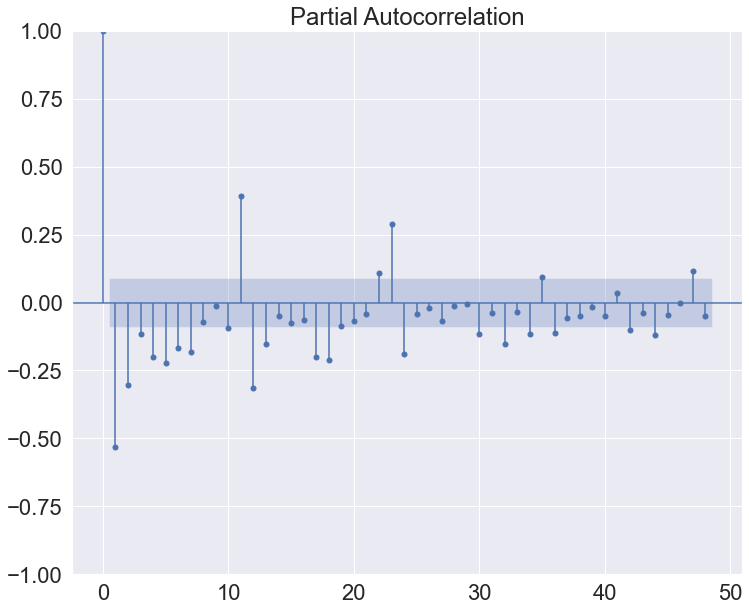

In [ ]:
plot_pacf(defuncionesLog_diff_1_12.dropna(inplace=False), lags=48)
plt.show()

Viendo el correlograma de la serie logarítmica doblemente diferenciada que es el que nos interesa, vemos ya decrecimiento rápido de 12 a 24, síntoma de estacionaredad.

Pasamos ahora el Test de Ljung-box:

In [ ]:
sm.stats.acorr_ljungbox(defuncionesLog_diff_1_12.dropna(inplace=False), lags=12, return_df=True)

,lb_stat,lb_pvalue
1,129.277008,5.898437e-30
2,131.195826,3.244804e-29
3,131.960187,2.044681e-28
4,138.668658,5.440652e-29
5,138.992492,2.929607e-28
6,139.241231,1.449008e-27
7,139.929947,5.257683e-27
8,143.423489,4.601465e-27
9,143.595483,1.865387e-26
10,145.371793,3.332200e-26


Obtenemos p valores absolutamente bajos, por lo que podemos afirmar que en absoluto es una serie ausente de autocorrelación.

Tomamos las particiones de training y test para el ajuste y evaluación del modelo, dejando los dos últimos años enteros 2017 y 2018 para la parte del test:

In [ ]:
import statsmodels.tsa.holtwinters as ets
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

defunciones_tr = defuncionesLog[:'2016-12-01']
defunciones_tst = defuncionesLog['2017-01-01':]

defunciones_tr

1980-01-01    8.493515
1980-02-01    8.410276
1980-03-01    8.508556
1980-04-01    8.416931
1980-05-01    8.495561
1980-06-01    8.466110
1980-07-01    8.508758
1980-08-01    8.510773
1980-09-01    8.475538
1980-10-01    8.528529
1980-11-01    8.498826
1980-12-01    8.574140
1981-01-01    8.524764
1981-02-01    8.416267
1981-03-01    8.524367
1981-04-01    8.469263
1981-05-01    8.521185
1981-06-01    8.486940
1981-07-01    8.553525
1981-08-01    8.506739
1981-09-01    8.471568
1981-10-01    8.557567
1981-11-01    8.506334
1981-12-01    8.597851
1982-01-01    8.551595
1982-02-01    8.488794
1982-03-01    8.531490
1982-04-01    8.513787
1982-05-01    8.566745
1982-06-01    8.526747
1982-07-01    8.556029
1982-08-01    8.539737
1982-09-01    8.452761
1982-10-01    8.585973
1982-11-01    8.569975
1982-12-01    8.610501
1983-01-01    8.644354
1983-02-01    8.532279
1983-03-01    8.556222
1983-04-01    8.511779
1983-05-01    8.569596
1983-06-01    8.531490
1983-07-01    8.589886
1983-08-01 

In [ ]:
defunciones_tst

2017-01-01    9.264639
2017-02-01    9.099856
2017-03-01    9.167537
2017-04-01    9.108529
2017-05-01    9.146868
2017-06-01    9.096275
2017-07-01    9.145588
2017-08-01    9.134647
2017-09-01    9.113609
2017-10-01    9.160309
2017-11-01    9.168893
2017-12-01    9.210940
2018-01-01    9.236008
2018-02-01    9.099074
2018-03-01    9.173469
2018-04-01    9.105535
2018-05-01    9.143132
2018-06-01    9.122492
2018-07-01    9.129022
2018-08-01    9.145268
2018-09-01    9.113719
2018-10-01    9.172535
2018-11-01    9.139381
2018-12-01    9.184304
Freq: MS, Name: Tumores, dtype: float64

In [ ]:
#forecast_accuracy(fc, test.values)

# Función para evaluar modelo
def eval_model(model,tr,tst,name='Model',lags=12):
    lb = np.mean(sm.stats.acorr_ljungbox(model.resid, lags=lags, return_df=True).lb_pvalue)
    pred = model.forecast(steps=len(tst))
    fig1, ax = plt.subplots()
    ax.plot(tr, label='training')
    ax.plot(tst, label='test')
    ax.plot(pred, label='prediction')
    plt.legend(loc='upper left')
    tit = name + ":  LjungBox p-value --> " + str(lb) + "\n MAPE: " + str(round(mean_absolute_percentage_error(tst, pred)*100,2)) + "%"
    plt.title(tit)
    plt.ylabel('Tumores')
    plt.xlabel('Fecha')
    plt.show()
    print(lb)


Una vez definida la función para evaluar el modelo, probamos los diferentes modelos de suavizado:

- ***Suavizado simple***: esperamos predicciones constantes para la ventana de test (sabemos de antemano que no ajustará bien pues está indicado para series sin tendencia y estacionalidad).

In [ ]:
ses = ets.SimpleExpSmoothing(defunciones_tr).fit()

ses.summary()

Dep. Variable:,Tumores,No. Observations:,444
Model:,SimpleExpSmoothing,SSE,0.680
Optimized:,True,AIC,-2873.611
Trend:,None,BIC,-2865.419
Seasonal:,None,AICC,-2873.519
Seasonal Periods:,None,Date:,"Wed, 15 Mar 2023"
Box-Cox:,False,Time:,11:39:50
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.1845565,alpha,True
initial_level,8.4779076,l.0,True


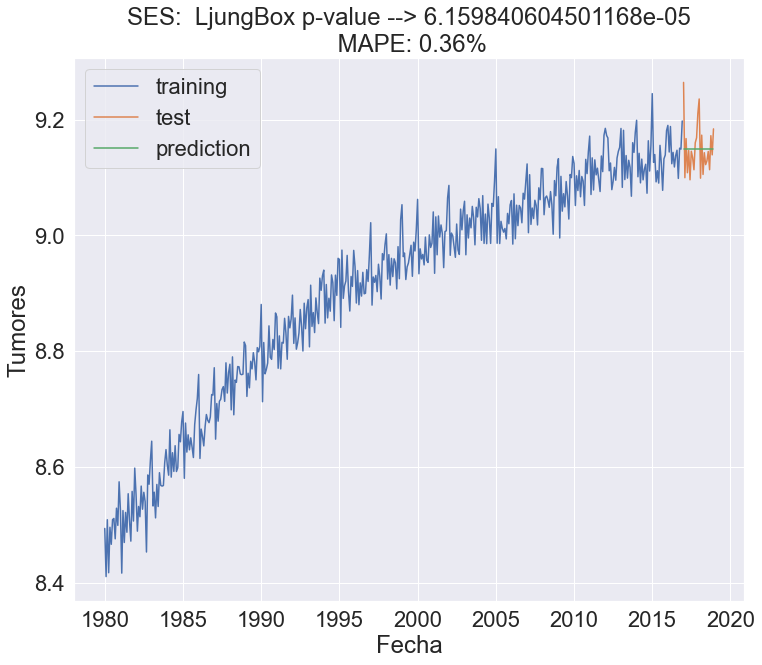

6.159840604501168e-05


In [ ]:
# Evaluar SES
eval_model(ses,defunciones_tr,defunciones_tst,'SES')


- ***Suavizado doble de Holt***: para series con pendiente pero sin componente estacional, por lo que tampoco ajustará bien. Esperamos como predicción una recta con pendiente.

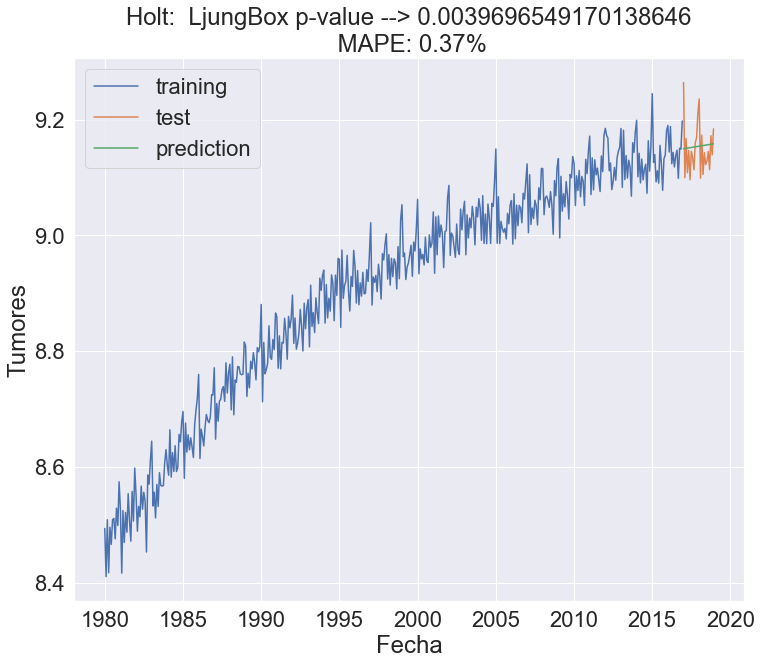

0.0039696549170138646


In [ ]:
# Suavizado de Holt
holt = ets.Holt(defunciones_tr).fit()
holt.summary()

eval_model(holt,defunciones_tr,defunciones_tst,'Holt')

- ***Suavizado de Holt Winters Aditivo***:

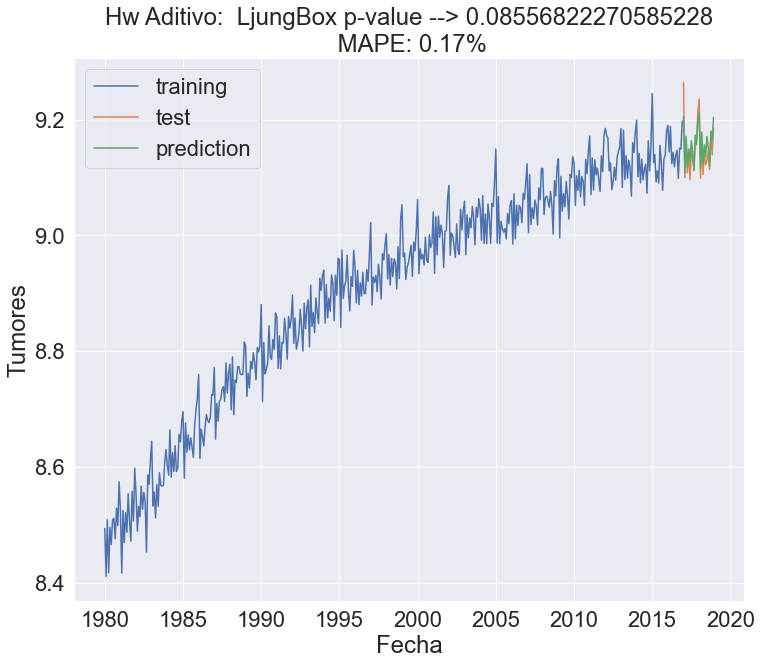

0.08556822270585228


In [ ]:
hw_add = ets.ExponentialSmoothing(defunciones_tr,trend='add', damped_trend=False, seasonal='add').fit()
hw_add.summary()

eval_model(hw_add,defunciones_tr,defunciones_tst,'Hw Aditivo')


In [ ]:
funciones.test_stationarity(hw_add.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -1.157812e+01
p-value                        2.988100e-21
#Lags Used                     3.000000e+00
Number of Observations Used    4.400000e+02
Critical Value (1%)           -3.445300e+00
Critical Value (5%)           -2.868131e+00
Critical Value (10%)          -2.570281e+00
dtype: float64


- ***Suavizado de Holt Winters Multiplicativo***: para captar la componente estacional no constante con el tiempo.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:83: RuntimeWarning:

overflow encountered in matmul



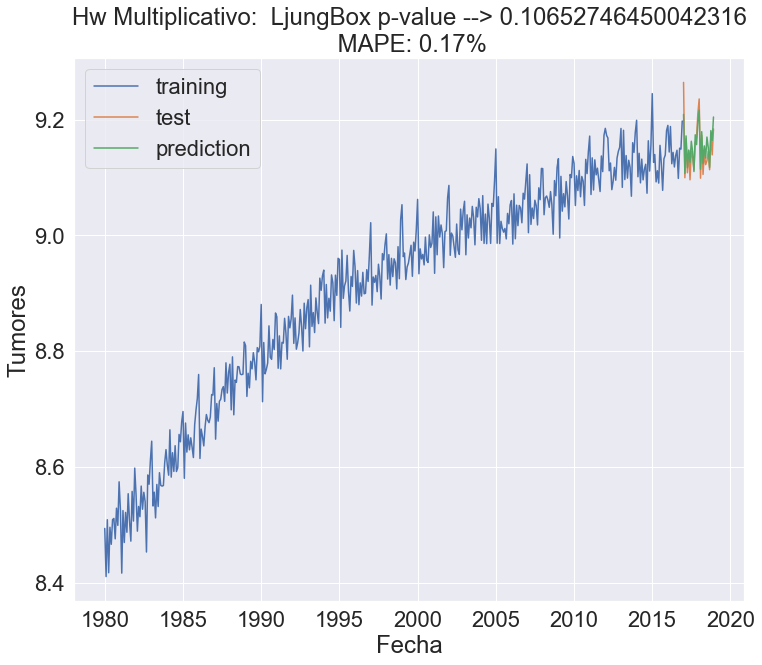

0.10652746450042316


In [ ]:
hw_mul = ets.ExponentialSmoothing(defunciones_tr,trend='mul', damped_trend=False, seasonal='mul').fit()
hw_mul.summary()

eval_model(hw_mul,defunciones_tr,defunciones_tst,'Hw Multiplicativo')

In [ ]:
funciones.test_stationarity(hw_mul.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -1.162672e+01
p-value                        2.314170e-21
#Lags Used                     3.000000e+00
Number of Observations Used    4.400000e+02
Critical Value (1%)           -3.445300e+00
Critical Value (5%)           -2.868131e+00
Critical Value (10%)          -2.570281e+00
dtype: float64


Medimos ahora las autocorrelaciones con intervalos de confianza, evaluando los correlogramas de los residuos para ambos modelos aditivo y multiplicativo:

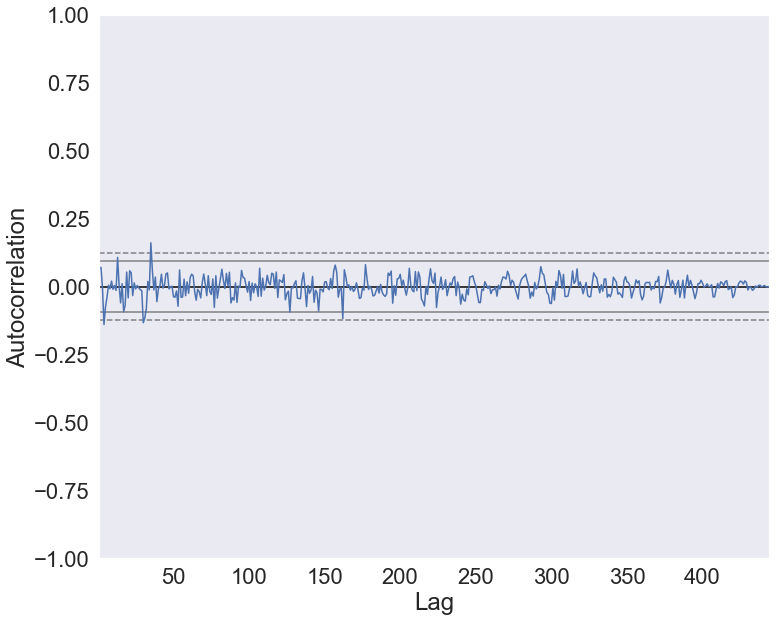

In [ ]:
from pandas.plotting import autocorrelation_plot

plt.clf()
autocorrelation_plot(hw_add.resid)
plt.show()

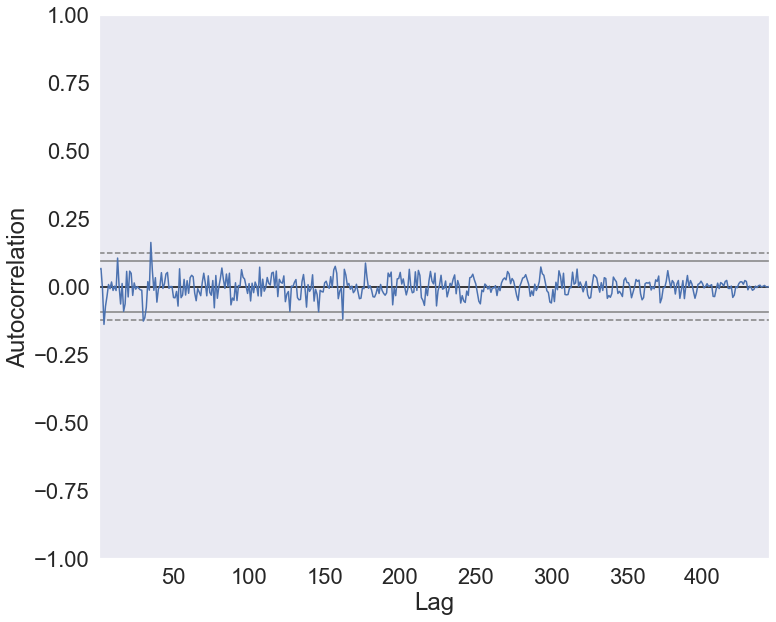

In [ ]:
plt.clf()
autocorrelation_plot(hw_mul.resid)
plt.show()

Interpretando los resultados de los dos modelos de suavizado más convenientes Holt Winters aditivo y multiplicativo: vemos que el el pvalor en el multiplicativo es ligeramente superior al del aditivo, pero en ambos el MAPE que indica los errores es de 0.17%. Por tanto pueden ser buenos modelos pero NO pasan el Test de Ljung box porque sus p valores están por debajo de 0.5 y no podemos decir que estén incorrelados.

Proponemos ahora los **modelos ARIMA**:

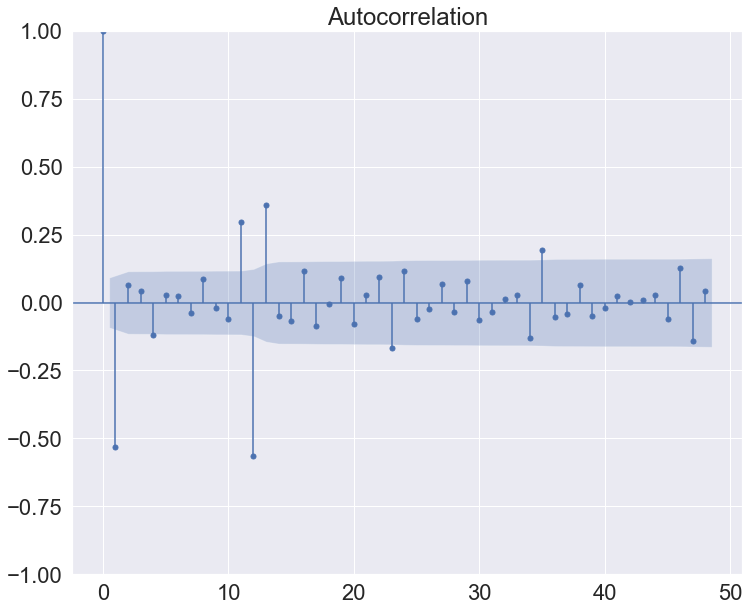

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



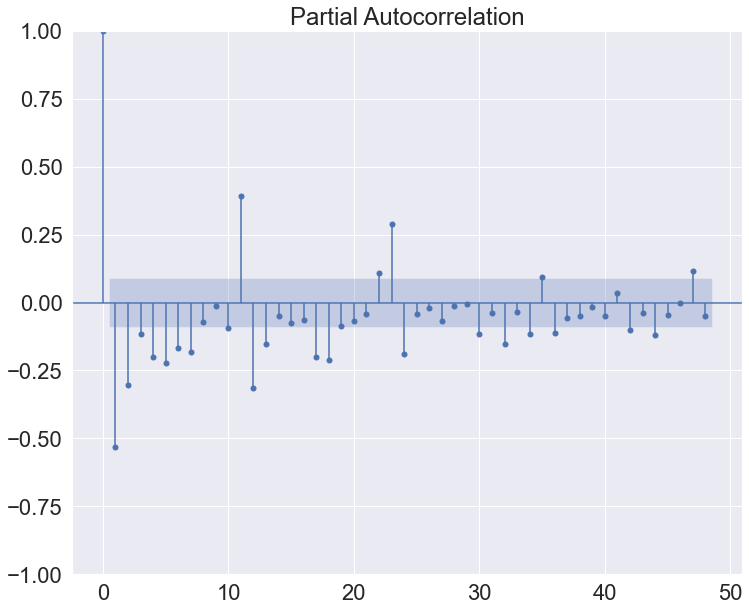

In [ ]:
plot_acf(defuncionesLog_diff_1_12.dropna(inplace=False), lags=48)
plt.show()
plot_pacf(defuncionesLog_diff_1_12.dropna(inplace=False), lags=48)
plt.show()

Viendo lo regular, se corta en los primeros retardos por lo tanto será MA. Lo confirmamos viendo que en el pacf que decrece rápido en los tres primeros periodos (decrecimiento y corte en 1 -> MA1).
Fijándonos en lo estacional, decrecimiento rápido o incluso borderline que podemos considerar como corte, y en pacf decremiento lento. Por lo tanto proponemos MA de orden 1 o 2, o incluso superposición ARMA.

**Modelo 1:** ambas partes MA:

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

arima1 = SARIMAX(defunciones_tr,
                order = (0, 1, 1),
                seasonal_order =(0, 1, 1, 12))

arima_1 = arima1.fit()
arima_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                            Tumores   No. Observations:                  444
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 12)   Log Likelihood                1062.744
Date:                            Wed, 15 Mar 2023   AIC                          -2119.488
Time:                                    11:40:54   BIC                          -2107.290
Sample:                                01-01-1980   HQIC                         -2114.672
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8386      0.029    -28.943      0.000      -0.895      -0.782
ma.S.L12      -0.8620      0.038    -22.699      0.000      -0.936      -0.788
sigma2         0.0004   2.24e-05     18.142      0.000       0.000       0.000
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                46.70
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               0.78   Skew:                             0.44
Prob(H) (two-sided):                  0.14   Kurtosis:                         4.35
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

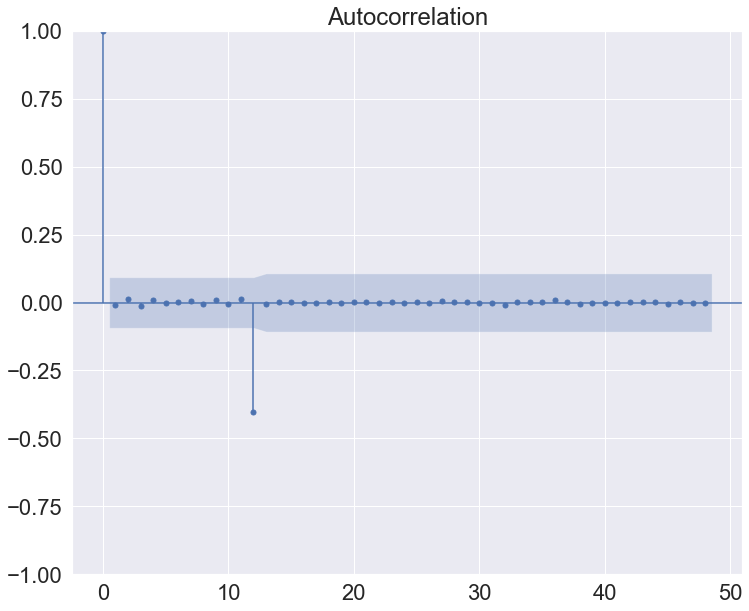

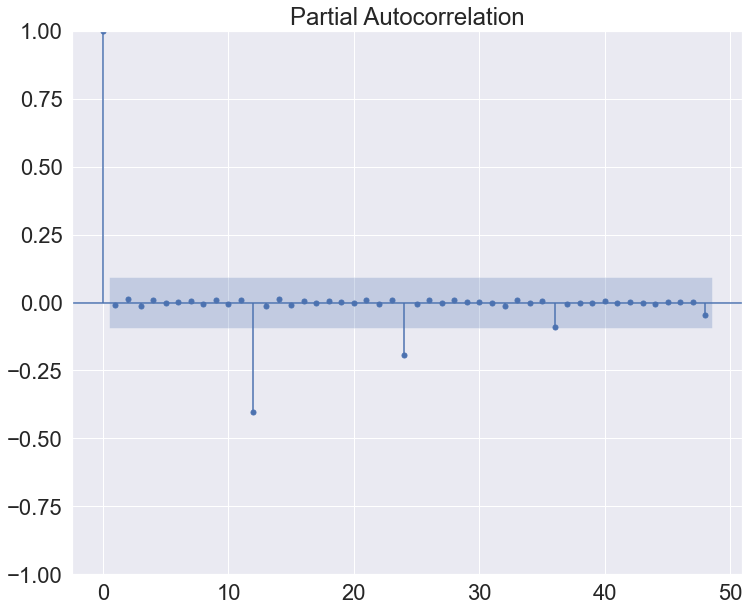

In [ ]:
plot_acf(arima_1.resid,lags=48)
plt.show()
plot_pacf(arima_1.resid,lags=48,method='ywm')
plt.show()

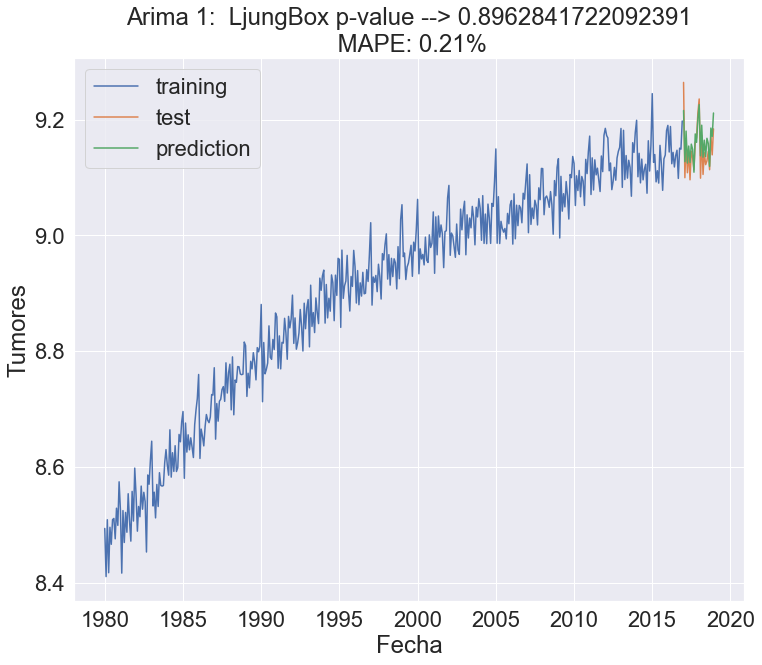

0.8962841722092391


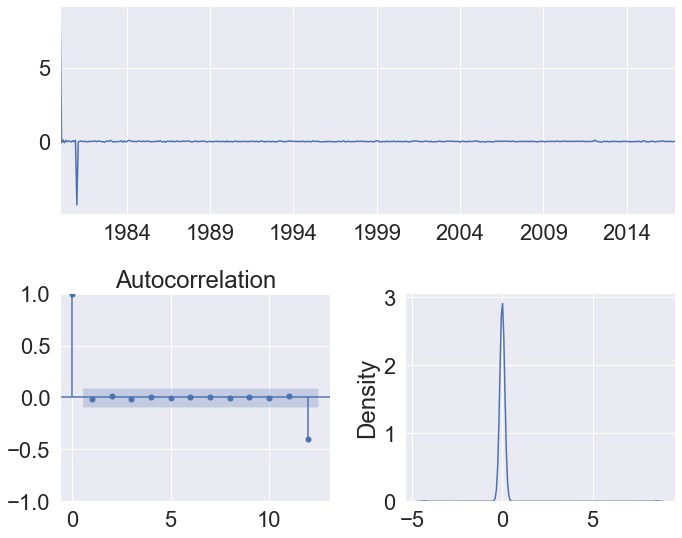

** Mean of the residuals:  0.01

** Ljung Box Test, p-value: 0.896 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot:>,
 <AxesSubplot:title={'center':'Autocorrelation'}>,
 <AxesSubplot:ylabel='Density'>)

In [ ]:
eval_model(arima_1, defunciones_tr, defunciones_tst, 'Arima 1')

funciones.residcheck(arima_1.resid,12)

Los residuos sí que pasan el test de Ljung-box y son estacionarios según AD Fuller <0.05.

**Modelo 2:** ambas partes MA:

In [ ]:
arima2 = SARIMAX(defunciones_tr,
                order = (1, 1, 0),
                seasonal_order =(1, 1, 0, 12))

arima_2 = arima2.fit()
arima_2.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                            Tumores   No. Observations:                  444
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                 957.620
Date:                            Wed, 15 Mar 2023   AIC                          -1909.240
Time:                                    11:41:17   BIC                          -1897.042
Sample:                                01-01-1980   HQIC                         -1904.424
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4889      0.036    -13.688      0.000      -0.559      -0.419
ar.S.L12      -0.5292      0.040    -13.207      0.000      -0.608      -0.451
sigma2         0.0007   4.16e-05     16.362      0.000       0.001       0.001
===================================================================================
Ljung-Box (L1) (Q):                   8.23   Jarque-Bera (JB):                 5.02
Prob(Q):                              0.00   Prob(JB):                         0.08
Heteroskedasticity (H):               0.69   Skew:                             0.06
Prob(H) (two-sided):                  0.03   Kurtosis:                         3.52
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

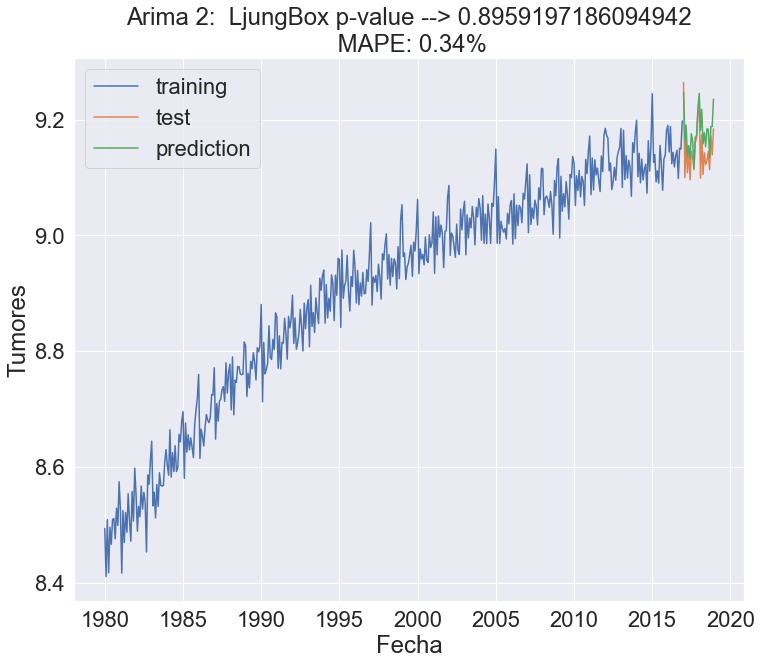

0.8959197186094942


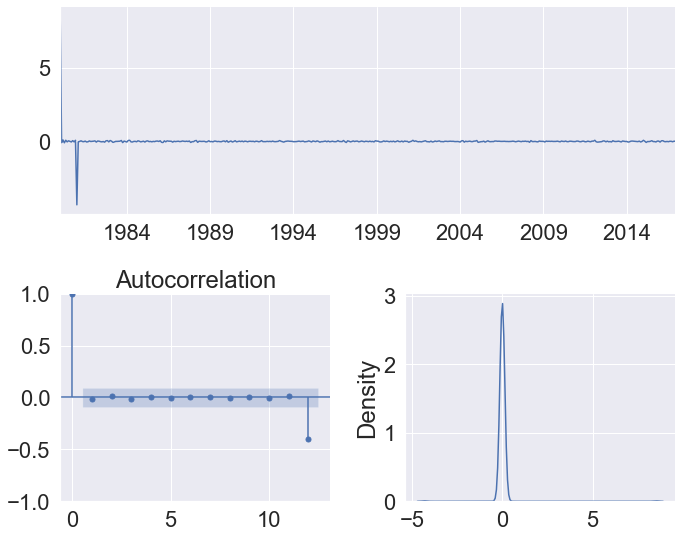

** Mean of the residuals:  0.01

** Ljung Box Test, p-value: 0.896 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot:>,
 <AxesSubplot:title={'center':'Autocorrelation'}>,
 <AxesSubplot:ylabel='Density'>)

In [ ]:
eval_model(arima_2, defunciones_tr, defunciones_tst, 'Arima 2')

funciones.residcheck(arima_2.resid,12)

El p valor no es malo pero suben los errores con un MAPE de 0.34%, sabíamos que no iba a ser del todo bueno porque en el correlograma no veíamos partes AR al menos en lo regular.

**Modelo 3:** superposición de efectos ARMA en regular y estacional:

In [ ]:
arima3 = SARIMAX(defunciones_tr,
                order = (1, 1, 1),
                seasonal_order =(1, 1, 1, 12))

arima_3 = arima3.fit()
arima_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                            Tumores   No. Observations:                  444
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood                1063.679
Date:                            Wed, 15 Mar 2023   AIC                          -2117.358
Time:                                    11:41:30   BIC                          -2097.028
Sample:                                01-01-1980   HQIC                         -2109.331
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0248      0.054      0.460      0.645      -0.081       0.131
ma.L1         -0.8450      0.033    -25.471      0.000      -0.910      -0.780
ar.S.L12      -0.0728      0.056     -1.290      0.197      -0.183       0.038
ma.S.L12      -0.8420      0.044    -19.201      0.000      -0.928      -0.756
sigma2         0.0004   2.23e-05     18.114      0.000       0.000       0.000
===================================================================================
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):                48.86
Prob(Q):                              0.73   Prob(JB):                         0.00
Heteroskedasticity (H):               0.75   Skew:                             0.45
Prob(H) (two-sided):                  0.09   Kurtosis:                         4.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

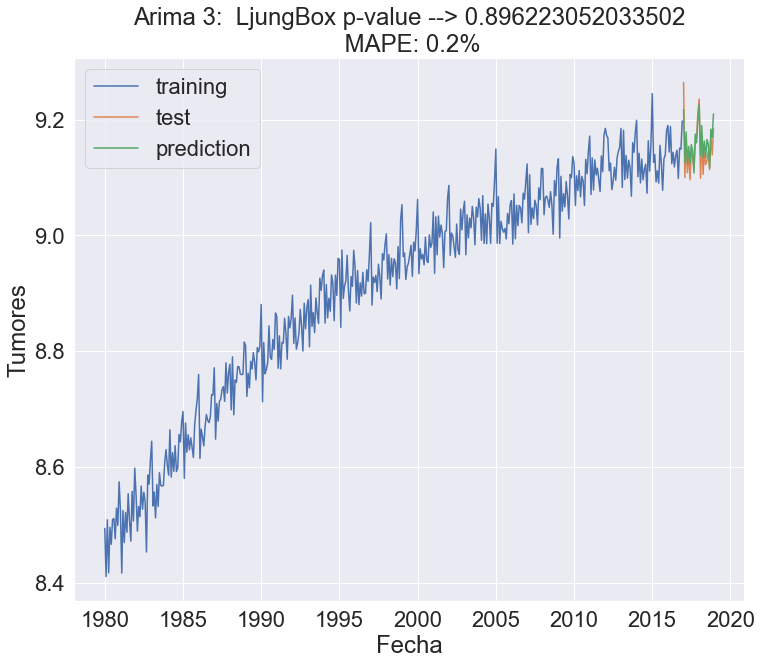

0.896223052033502


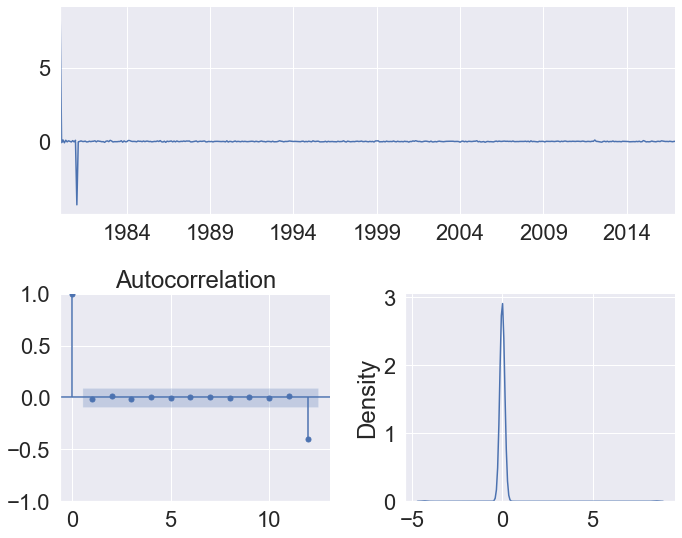

** Mean of the residuals:  0.01

** Ljung Box Test, p-value: 0.896 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot:>,
 <AxesSubplot:title={'center':'Autocorrelation'}>,
 <AxesSubplot:ylabel='Density'>)

In [ ]:
eval_model(arima_3, defunciones_tr, defunciones_tst, 'Arima 3')
funciones.residcheck(arima_3.resid,12)

En el análisis del summary vemos que ar.L1 y ar.S.L12 no son significativos. Es cierto que baja un poquito el MAPE pero hemos añadido dos parámetros que no son significativos.

Por lo tanto es mejor el primer modelo, nos quedaríamos con el Modelo ARIMA 1 que pasa el Test de Ljung-box con un 0.896 y tiene un MAPE de 0.21%.

Probamos la función de autoarima:

In [ ]:
import pmdarima as pm

# Ajustamos modelo arima step-wise con métrica AIC para la serie de vuelos
arima_auto = pm.auto_arima(defunciones_tr, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=5, max_q=5, # maximum p and q
                      m=12,              # frequency of series
                      d=1,           # let model determine 'd'
                      seasonal=True,   # No Seasonality
                      #start_P=None,
                      D=None,
                      trace=True,
                      error_action='ignore',
                      suppress_warnings=True,
                      stepwise=True)

print(arima_auto.summary())


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=-2128.477, Time=2.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-1339.055, Time=0.21 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-1876.126, Time=1.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-1809.771, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-1340.659, Time=0.04 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=-1811.200, Time=1.39 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=-1982.013, Time=1.84 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=-2125.451, Time=4.35 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=-2119.337, Time=4.59 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=-1640.490, Time=0.96 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=-1883.099, Time=3.25 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=-2072.215, Time=3.16 sec
 ARIMA(1,1,1)(2,0,2)[12] intercept   : AIC=-2146.483, Time=4.82 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=-2129.080, Time=3.23 sec
 ARIM

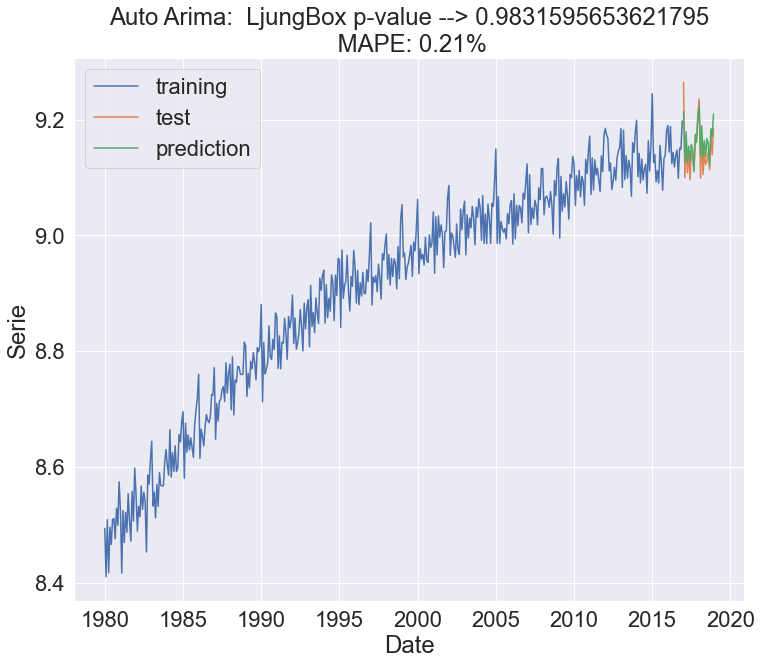

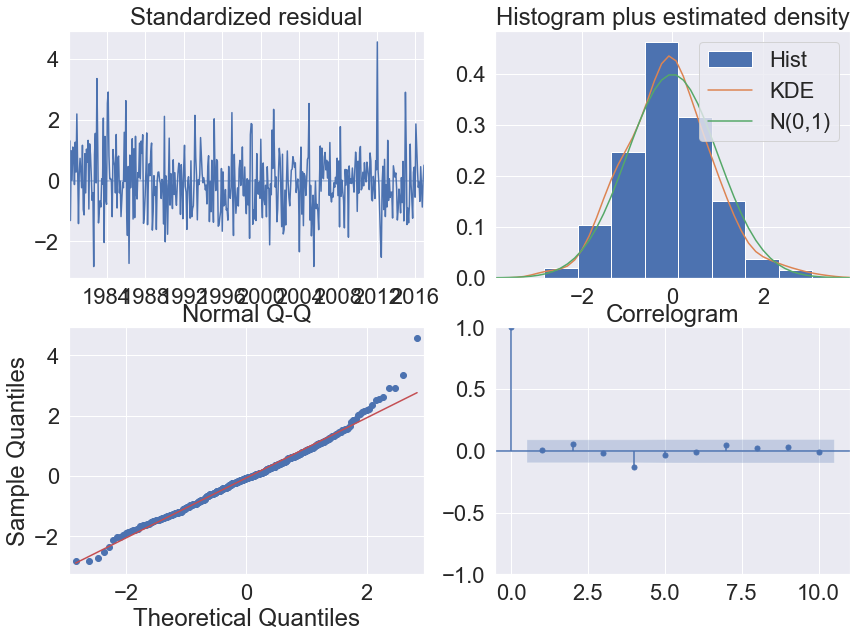

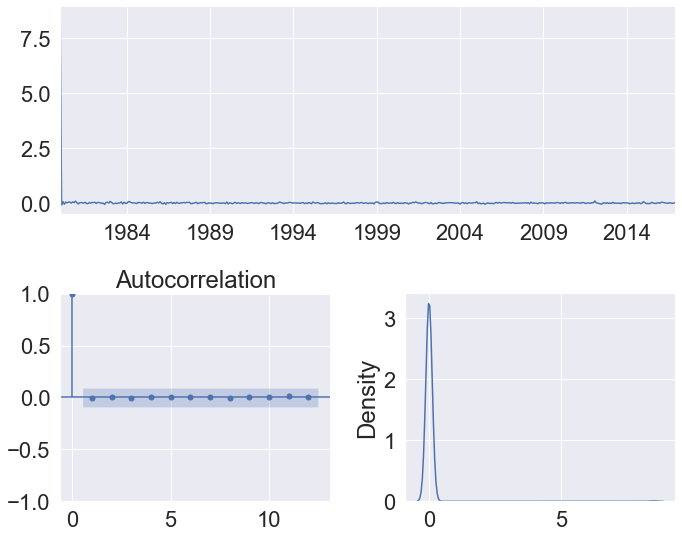

** Mean of the residuals:  0.02

** Ljung Box Test, p-value: 0.983 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot:>,
 <AxesSubplot:title={'center':'Autocorrelation'}>,
 <AxesSubplot:ylabel='Density'>)

In [ ]:
funciones.eval_model_Aarima(arima_auto, defunciones_tr, defunciones_tst, 'Auto Arima')
funciones.residcheck(arima_auto.resid(),12)

También obtenemos un modelo muy potente y competitivo que pasa los test de Ljung-box y AD Fuller. Tiene un parámetro más pero todos son significativos. Con un pvalor de 0.983 y un MAPE de 0.21%.

Por tanto, podemos concluir que tanto el Modelo ARIMA 1 como el propuesto por AUTOARIMA son buenos modelos y podríamos quedarnos con cualquieraa de ellos.

#

#

# Ejercicio 3

Con los datos de wisconsin.xlsx que se encuentran en la carpeta Datos de la
documentación.
- 1- Leer el archivo
- 2- Obtener la matriz de correlaciones entre las variables numéricas.
Conclusiones.
- 3- Sabiendo que se trata de predecir la variable binaria diagnosis (‘M,’B’). ¿Cuál sería el modelo adecuado de predicción? ¿Qué problemas auguras a la luz de
la información sobre las correlaciones del archivo?
- 4- Como posible estrategia se plantea la realización de un ACP para la reducción
de dimensiones y un modelo de predicción adecuado utilizando como
predictores las componentes principales resultantes de tal forma que se
retenga al menos el 70% de la variabilidad del archivo.
  -   a. Valora la adecuación muestral a priori
  -   b. Realiza el ACP sobre las numéricas. ¿Cuántas componentes se deberían
considerar para cumplir el criterio mencionado? Interpreta la
componente 1.
  -  c. Crea el input con estas componentes (matriz de scores o puntuaciones)
y ajusta un modelo de predicción adecuado para la variable objetivo
diagnosis.
  -  d. Conclusiones del modelo por validación cruzada repetida. Interpreta el
parámetro de la componente 1.

Importamos todas las librerías que nos van a hacer falta:

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import plotly.express as px

#PCA
from sklearn.preprocessing import StandardScaler, scale
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA

#Factor Analysis
from sklearn.decomposition import FactorAnalysis
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo

#Encoding
from sklearn.preprocessing import LabelEncoder

pd.set_option("display.max_rows", None, "display.max_columns", None)

Leemos el archivo xlsx y mostramos el encabezado:

In [ ]:
# Lectura de datos
wisconsin = pd.read_excel('C:\\Users\\ruizi\\Documents\\ÍÑIGO\\MÁSTER BIG DATA UCM\\7. Minería de datos y modelización predictiva\\Datos\\wisconsin.xlsx')

wisconsin.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


Transformamos las M de diagnosis en 1 y las B en 0, y vemos la info del df:

In [ ]:
wisconsin['diagnosis'] = wisconsin['diagnosis'].map({'M':1, 'B':0})

wisconsin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    int64  
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

Contamos los 1 y 0:

In [ ]:
wisconsin.diagnosis.value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

Eliminamos la variable objetivo binaria 'diagnosis':

In [ ]:
varObjBin = wisconsin.diagnosis
imput_wisconsin = wisconsin.drop(['id', 'diagnosis'], axis=1)
imput_wisconsin.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


Generamos la matriz de correlaciones:

In [ ]:
corr = imput_wisconsin.corr()
corr.style.background_gradient(cmap='coolwarm').format(precision=5)


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.00000,0.32378,0.99786,0.98736,0.17058,0.50612,0.67676,0.82253,0.14774,-0.31163,0.67909,-0.09732,0.67417,0.73586,-0.22260,0.20600,0.19420,0.37617,-0.10432,-0.04264,0.96954,0.29701,0.96514,0.94108,0.11962,0.41346,0.52691,0.74421,0.16395,0.00707
texture_mean,0.32378,1.00000,0.32953,0.32109,-0.02339,0.23670,0.30242,0.29346,0.07140,-0.07644,0.27587,0.38636,0.28167,0.25984,0.00661,0.19197,0.14329,0.16385,0.00913,0.05446,0.35257,0.91204,0.35804,0.34355,0.07750,0.27783,0.30103,0.29532,0.10501,0.11921
perimeter_mean,0.99786,0.32953,1.00000,0.98651,0.20728,0.55694,0.71614,0.85098,0.18303,-0.26148,0.69177,-0.08676,0.69313,0.74498,-0.20269,0.25074,0.22808,0.40722,-0.08163,-0.00552,0.96948,0.30304,0.97039,0.94155,0.15055,0.45577,0.56388,0.77124,0.18912,0.05102
area_mean,0.98736,0.32109,0.98651,1.00000,0.17703,0.49850,0.68598,0.82327,0.15129,-0.28311,0.73256,-0.06628,0.72663,0.80009,-0.16678,0.21258,0.20766,0.37232,-0.07250,-0.01989,0.96275,0.28749,0.95912,0.95921,0.12352,0.39041,0.51261,0.72202,0.14357,0.00374
smoothness_mean,0.17058,-0.02339,0.20728,0.17703,1.00000,0.65912,0.52198,0.55370,0.55777,0.58479,0.30147,0.06841,0.29609,0.24655,0.33238,0.31894,0.24840,0.38068,0.20077,0.28361,0.21312,0.03607,0.23885,0.20672,0.80532,0.47247,0.43493,0.50305,0.39431,0.49932
compactness_mean,0.50612,0.23670,0.55694,0.49850,0.65912,1.00000,0.88312,0.83114,0.60264,0.56537,0.49747,0.04620,0.54891,0.45565,0.13530,0.73872,0.57052,0.64226,0.22998,0.50732,0.53532,0.24813,0.59021,0.50960,0.56554,0.86581,0.81628,0.81557,0.51022,0.68738
concavity_mean,0.67676,0.30242,0.71614,0.68598,0.52198,0.88312,1.00000,0.92139,0.50067,0.33678,0.63192,0.07622,0.66039,0.61743,0.09856,0.67028,0.69127,0.68326,0.17801,0.44930,0.68824,0.29988,0.72956,0.67599,0.44882,0.75497,0.88410,0.86132,0.40946,0.51493
concave points_mean,0.82253,0.29346,0.85098,0.82327,0.55370,0.83114,0.92139,1.00000,0.46250,0.16692,0.69805,0.02148,0.71065,0.69030,0.02765,0.49042,0.43917,0.61563,0.09535,0.25758,0.83032,0.29275,0.85592,0.80963,0.45275,0.66745,0.75240,0.91016,0.37574,0.36866
symmetry_mean,0.14774,0.07140,0.18303,0.15129,0.55777,0.60264,0.50067,0.46250,1.00000,0.47992,0.30338,0.12805,0.31389,0.22397,0.18732,0.42166,0.34263,0.39330,0.44914,0.33179,0.18573,0.09065,0.21917,0.17719,0.42668,0.47320,0.43372,0.43030,0.69983,0.43841
fractal_dimension_mean,-0.31163,-0.07644,-0.26148,-0.28311,0.58479,0.56537,0.33678,0.16692,0.47992,1.00000,0.00011,0.16417,0.03983,-0.09017,0.40196,0.55984,0.44663,0.34120,0.34501,0.68813,-0.25369,-0.05127,-0.20515,-0.23185,0.50494,0.45880,0.34623,0.17533,0.33402,0.76730


Inspeccionando el archivo encontramos las variables: radius, texture, perimeter, area, smoothness, compactness, concavity, concave points, symmetry, fractal_dimension "triplicadas" con su mean, se, worst. Además tenemos el id que hemos fijado como index y la variable diagnosis que es categórica (M o B).

Calculamos esfericidad de Bartlett y kmo:

In [ ]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
calculate_bartlett_sphericity(imput_wisconsin)

(39362.120841131145, 0.0)

In [ ]:
from factor_analyzer.factor_analyzer import calculate_kmo
calculate_kmo(imput_wisconsin)

C:\Users\ruizi\AppData\Roaming\Python\Python39\site-packages\factor_analyzer\utils.py:244: UserWarning:

The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.



(array([0.83463512, 0.64352613, 0.85334054, 0.86403253, 0.814716  ,
        0.87939755, 0.89192843, 0.90027723, 0.82510264, 0.83181381,
        0.83412178, 0.48458942, 0.84290718, 0.85199881, 0.64427854,
        0.8712978 , 0.82547994, 0.83516673, 0.5832182 , 0.81149623,
        0.82308704, 0.60329755, 0.88493799, 0.82044529, 0.75316064,
        0.85127714, 0.90222587, 0.89105242, 0.69074764, 0.81233969]),
 0.8322253094698239)

Obtenemos valores notablemente superiores a 0.5 lo cuál es buena señal (excepto un valor de 0.4846).

En este punto procedemos a escalar los datos por las diferentes unidades de medida:

In [ ]:
scaler = StandardScaler()
scaler.fit(imput_wisconsin)
X = pd.DataFrame(scaler.transform(imput_wisconsin), columns = imput_wisconsin.columns)
pd.DataFrame(X)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,2.489734,-0.565265,2.833031,2.487578,-0.214002,1.316862,0.724026,0.660820,1.148757,0.907083,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,0.499255,-0.876244,0.263327,0.742402,-0.605351,-0.692926,-0.440780,0.260162,-0.805450,-0.099444,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,1.228676,-0.780083,0.850928,1.181336,-0.297005,0.814974,0.213076,1.424827,0.237036,0.293559,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,0.326373,-0.110409,0.286593,-0.288378,0.689702,2.744280,0.819518,1.115007,4.732680,2.047511,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,1.270543,-0.790244,1.273189,1.190357,1.483067,-0.048520,0.828471,1.144205,-0.361092,0.499328,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100
5,-0.476375,-0.835335,-0.387148,-0.505650,2.237421,1.244335,0.866302,0.824656,1.005402,1.890005,-0.255070,-0.592662,-0.321304,-0.289258,0.156347,0.445544,0.160025,-0.069124,0.134119,0.486846,-0.165498,-0.313836,-0.115009,-0.244320,2.048513,1.721616,1.263243,0.905888,1.754069,2.241802
6,1.170908,0.160649,1.138125,1.095295,-0.123136,0.088295,0.300072,0.646935,-0.064325,-0.762332,0.149883,-0.804940,0.155410,0.298627,-0.909030,-0.651568,-0.310141,-0.228089,-0.829666,-0.611218,1.368983,0.322883,1.368325,1.275220,0.518640,0.021215,0.509552,1.196716,0.262476,-0.014730
7,-0.118517,0.358450,-0.072867,-0.218965,1.604049,1.140102,0.061026,0.281950,1.403355,1.660353,0.643623,0.290561,0.490051,0.233722,0.588031,0.268933,-0.232554,0.435349,-0.688004,0.611669,0.163763,0.401048,0.099449,0.028859,1.447961,0.724786,-0.021054,0.624196,0.477640,1.726435
8,-0.320167,0.588830,-0.184080,-0.384207,2.201839,1.684010,1.219096,1.150692,1.965600,1.572462,-0.356850,-0.389818,-0.227743,-0.352403,-0.436677,0.533290,0.120568,0.075243,0.107482,-0.017363,-0.161357,0.822813,-0.031609,-0.248363,1.662757,1.818310,1.280035,1.391616,2.389857,1.288650
9,-0.473535,1.105439,-0.329482,-0.509063,1.582699,2.563358,1.738872,0.941760,0.797298,2.783096,-0.388250,0.693345,-0.409420,-0.360764,0.036008,2.609587,1.509848,0.409395,-0.321136,2.377346,-0.244190,2.443109,-0.286278,-0.297409,2.320295,5.112877,3.995433,1.620015,2.370444,6.846856


**Análisis de componente principales**

Obtenemos la descomposición en valores singulares y el resultado de componentes para los datos con pca:

In [ ]:
pca = PCA(n_components=0.7)
scores = pd.DataFrame(pca.fit_transform(X), columns = ['PC1', 'PC2', 'PC3'])
pd.DataFrame(scores)

,PC1,PC2,PC3
0,9.192837,1.948583,-1.123166
1,2.387802,-3.768172,-0.529293
2,5.733896,-1.075174,-0.551748
3,7.122953,10.275589,-3.232790
4,3.935302,-1.948072,1.389767
5,2.380247,3.949929,-2.934877
6,2.238883,-2.690031,-1.639913
7,2.143299,2.340244,-0.871947
8,3.174924,3.391813,-3.119986
9,6.351747,7.727174,-4.341916


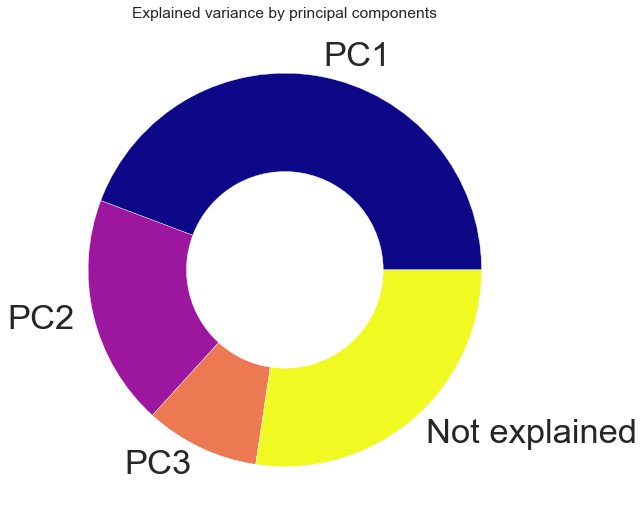

In [ ]:
from psynlig import pca_explained_variance_pie
plt.style.use('seaborn-talk')

fig, axi = pca_explained_variance_pie(pca, cmap='plasma')
axi.set_title('Explained variance by principal components')

plt.show()

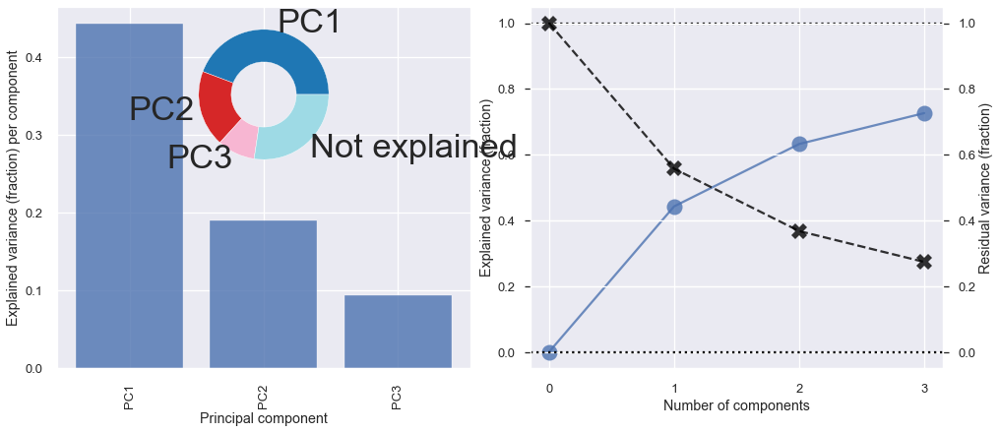

In [ ]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from psynlig import (
    pca_explained_variance,
    pca_residual_variance,
    pca_explained_variance_bar,
    pca_explained_variance_pie,
    pca_1d_loadings,
    pca_2d_loadings,
    pca_2d_scores
)

fig, (ax1, ax2) = plt.subplots(
    nrows=1, ncols=2, figsize=(14, 6), constrained_layout=True
)
pca_explained_variance_bar(pca, axi=ax1, alpha=0.8)
pca_explained_variance(pca, axi=ax2, marker='o', markersize=16, alpha=0.8)
ax4 = ax2.twinx()
pca_residual_variance(
    pca,
    ax4,
    marker='X',
    markersize=16,
    alpha=0.8,
    color='black',
    linestyle='--'
)
ax3 = inset_axes(ax1, width='45%', height='45%', loc=9)
pca_explained_variance_pie(pca, axi=ax3, cmap='tab20')
plt.show()

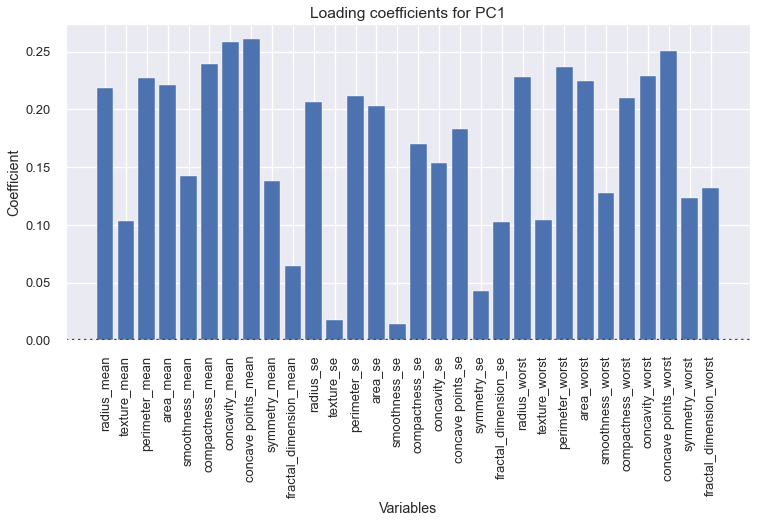

In [ ]:
pca_1d_loadings(
        pca,
        imput_wisconsin.columns,
        select_components={1},
        plot_type='bar',
    )
plt.show()


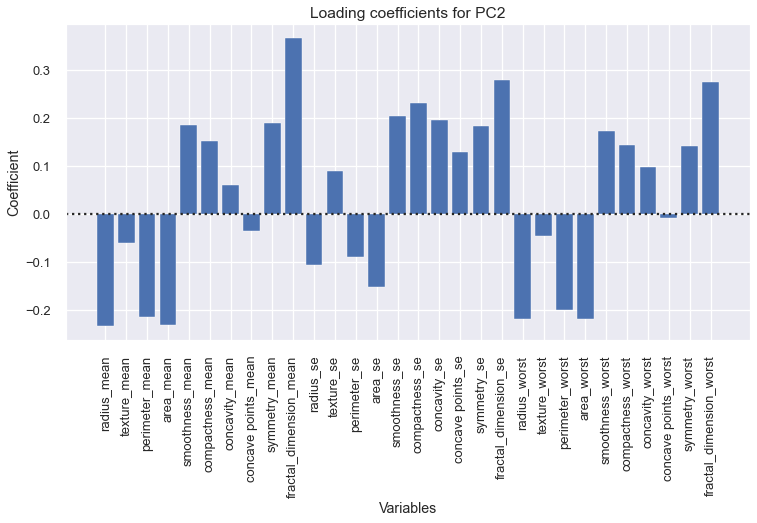

In [ ]:
pca_1d_loadings(
        pca,
        imput_wisconsin.columns,
        select_components={2},
        plot_type='bar',
    )
plt.show()


Realizamos la partición training-test:

In [ ]:
# Función necesaria
from sklearn.model_selection import train_test_split

# Creamos 4 objetos: predictores para tr y tst y variable objetivo para tr y tst.
X_train, X_test, y_train, y_test = train_test_split(scores, varObjBin, test_size=0.2, random_state=42)
#wis_pca_diagnosis=scores.join(varObjBin.astype('int64'))

# Comprobamos dimensiones
print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)


Training dataset shape: (455, 3) (455,)
Testing dataset shape: (114, 3) (114,)


Contamos valores del training y test:

In [ ]:
y_train.value_counts(normalize=True)
y_test.value_counts(normalize=True)

0    0.622807
1    0.377193
Name: diagnosis, dtype: float64

Generamos el training con la objetivo dentro:

In [ ]:
# Genero el training con la objetivo dentro
data_train = X_train.join(y_train.astype('int64'))
data_train.head()


,PC1,PC2,PC3,diagnosis
68,4.330003,9.202526,1.492963,0
181,9.007166,0.581031,-3.134715,1
63,-2.314132,3.267990,2.796224,0
248,-2.582556,0.729213,-0.548143,0
60,-2.385836,2.757658,1.214086,0


In [ ]:
wis_pca_diagnosis=scores.join(varObjBin.astype('int64'))

Obtenemos ahora la fórmula del modelo completo y el análisis de este modelo completo de referencia:

In [ ]:
import NuestrasFunciones as funciones
formC=funciones.ols_formula(wis_pca_diagnosis, 'diagnosis')
formC

'diagnosis ~ PC1 + PC2 + PC3'

In [ ]:
from statsmodels.formula.api import logit

modelC = logit(formC, data = wis_pca_diagnosis).fit()
modelC.summary()

Optimization terminated successfully.
         Current function value: 0.108409
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  569
Model:                          Logit   Df Residuals:                      565
Method:                           MLE   Df Model:                            3
Date:                Wed, 15 Mar 2023   Pseudo R-squ.:                  0.8358
Time:                        11:45:54   Log-Likelihood:                -61.685
converged:                       True   LL-Null:                       -375.72
Covariance Type:            nonrobust   LLR p-value:                8.278e-136
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.6762      0.242     -2.796      0.005      -1.150      -0.202
PC1            2.3183      0.304      7.616      0.000       1.722       2.915
PC2           -1.2829      0.212     -6.059      0.000      -1.698      -0.868
PC3           -0.4878      0.141     -3.468      0.001      -0.764      -0.212
==============================================================================

Possibly complete quasi-separation: A fraction 0.27 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

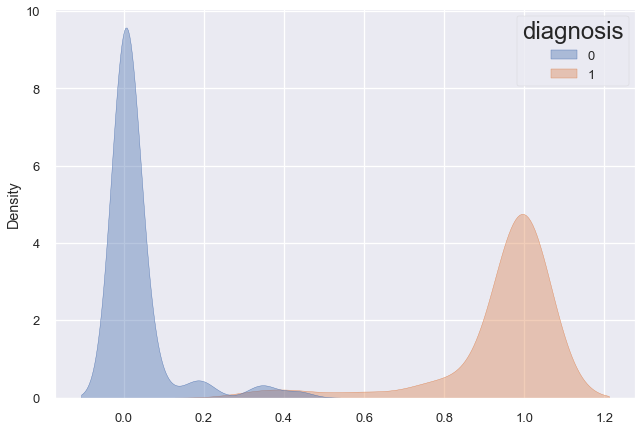

In [ ]:
import seaborn
y_pred = modelC.predict(X_test)
plt.clf()
seaborn.kdeplot(x=y_pred, hue=y_test, fill=True, common_norm=False, alpha=0.4)
plt.show()

Los pca muestran valores muy bajos = buena señal.

Hacemos una lista de las posibles fórmulas candidatas que comprobaremos mediante validación cruzada:

In [ ]:
form2 = 'diagnosis ~ PC1 + PC2'
form3 = 'diagnosis ~ PC1 + PC3'
form4 = 'diagnosis ~ PC2 + PC3'

list_form = [formC, form2, form3, form4]

In [ ]:
# Aplicamos a toda la lista la función creada (devuelve un dataframe pero está transpuesto)
list_res = pd.DataFrame(map(lambda x: funciones.cross_val_log(x, wis_pca_diagnosis, seed=2022),list_form))

# Trasnponer dataframe y pasar de wide a long (creando un factor variable con el nombre de cada fórmula de la lista[0,1,2,3])
results = list_res.T.melt()
results.columns = ['Modelo','R2']
results.head()

Modelo: diagnosis ~ PC1 + PC2 + PC3
AUC: 0.990 (0.007)
Modelo: diagnosis ~ PC1 + PC2
AUC: 0.989 (0.007)
Modelo: diagnosis ~ PC1 + PC3
AUC: 0.971 (0.012)
Modelo: diagnosis ~ PC2 + PC3
AUC: 0.660 (0.045)


,Modelo,R2
0,0,0.994885
1,0,0.968593
2,0,0.991156
3,0,0.995625
4,0,0.997685


In [ ]:
# Aplicamos a toda la lista la función creada (devuelve un dataframe pero está transpuesto)
list_res = pd.DataFrame(map(lambda x: funciones.cross_val_lin(x, wis_pca_diagnosis, seed=2022),list_form))

# Trasnponer dataframe y pasar de wide a long (creando un factor variable con el nombre de cada fórmula de la lista[0,1,2,3])
results = list_res.T.melt()
results.columns = ['Modelo','R2']
results.head()


Modelo: diagnosis ~ PC1 + PC2 + PC3
Coeficiente de determinación R2: 0.669 (0.045)
Modelo: diagnosis ~ PC1 + PC2
Coeficiente de determinación R2: 0.643 (0.052)
Modelo: diagnosis ~ PC1 + PC3
Coeficiente de determinación R2: 0.635 (0.045)
Modelo: diagnosis ~ PC2 + PC3
Coeficiente de determinación R2: 0.038 (0.044)


,Modelo,R2
0,0,0.690241
1,0,0.649831
2,0,0.655405
3,0,0.640142
4,0,0.733272


El modelo completo es el que tiene mayor coeficiente de determinación R2, por lo tanto el que funcionará mejor.

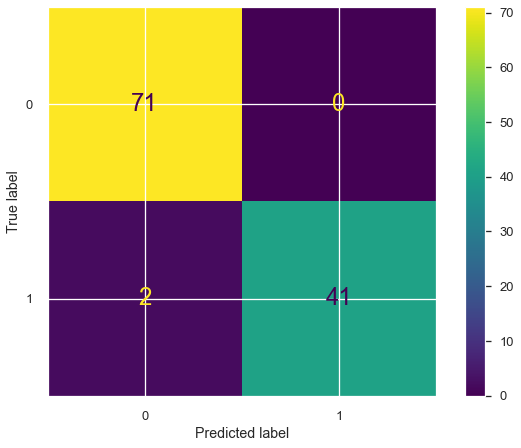

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
y_test= y_test.astype(y_pred.dtype)
cm = confusion_matrix(y_test, round(y_pred))

cm_display = ConfusionMatrixDisplay(cm).plot()
cm_display

Calculamos los OR aplicando las exponenciales de forma natural:

In [ ]:
np.exp(modelC.params)

Intercept     0.508541
PC1          10.158264
PC2           0.277231
PC3           0.613948
dtype: float64

La Odds Ratio, o razón de probabilidades, indica que es 10 veces más proabable que se dé el evento de que no se dé el evento por aumento unitario de la PC1.

In [ ]:
pca.components_

array([[ 0.21890244,  0.10372458,  0.22753729,  0.22099499,  0.14258969,
         0.23928535,  0.25840048,  0.26085376,  0.13816696,  0.06436335,
         0.20597878,  0.01742803,  0.21132592,  0.20286964,  0.01453145,
         0.17039345,  0.15358979,  0.1834174 ,  0.04249842,  0.10256832,
         0.22799663,  0.10446933,  0.23663968,  0.22487053,  0.12795256,
         0.21009588,  0.22876753,  0.25088597,  0.12290456,  0.13178394],
       [-0.23385713, -0.05970609, -0.21518136, -0.23107671,  0.18611302,
         0.15189161,  0.06016536, -0.0347675 ,  0.19034877,  0.36657547,
        -0.10555215,  0.08997968, -0.08945723, -0.15229263,  0.20443045,
         0.2327159 ,  0.19720728,  0.13032156,  0.183848  ,  0.28009203,
        -0.21986638, -0.0454673 , -0.19987843, -0.21935186,  0.17230435,
         0.14359317,  0.09796411, -0.00825724,  0.14188335,  0.27533947],
       [-0.00853124,  0.0645499 , -0.00931422,  0.02869953, -0.1042919 ,
        -0.07409157,  0.00273384, -0.02556354, -0

Calculamos el peso de diferentes variables en PC1:

In [ ]:
k1_spss = pca.components_/np.sqrt(pca.explained_variance_.reshape(3,1))
k1_spss

array([[ 0.06001272,  0.02843639,  0.06237999,  0.0605864 ,  0.03909137,
         0.06560075,  0.07084122,  0.07151379,  0.03787886,  0.01764539,
         0.05646966,  0.00477794,  0.0579356 ,  0.05561728,  0.00398384,
         0.04671384,  0.04210707,  0.0502844 ,  0.01165106,  0.02811939,
         0.06250592,  0.02864056,  0.06487543,  0.06164889,  0.03507855,
         0.05759838,  0.06271726,  0.0687811 ,  0.03369463,  0.03612894],
       [-0.09794016, -0.02500511, -0.09011869, -0.09677572,  0.07794477,
         0.06361272,  0.02519746, -0.01456075,  0.07971871,  0.15352306,
        -0.0442056 ,  0.0376838 , -0.03746499, -0.06378067,  0.08561617,
         0.09746221,  0.08259108,  0.05457911,  0.07699617,  0.1173035 ,
        -0.09208079, -0.01904186, -0.08370977, -0.09186531,  0.07216165,
         0.06013731,  0.04102771, -0.00345816,  0.05942123,  0.11531311],
       [-0.00507766,  0.03841909, -0.00554368,  0.01708151, -0.0620729 ,
        -0.04409814,  0.00162714, -0.01521502, -0

Con esto podemos deducir que PC1 tiene mayor efecto sobre los tumores. Con PC1 podemos ver que las variables con la mayor proporción en PC1 son concavity_mean, concavity_...

#

#

# Ejercicio 4

El conjunto de datos DatosEleccionesEspaña.xlsx contiene información demográfica
sobre los distintos municipios de España junto con los resultados que se obtuvieron en un proceso electoral. En esta práctica, el objetivo fundamental es crear grupos de comunidades autónomas en función de ciertas características previamente seleccionadas.
- 1- Escoge 10 variables numéricas presentes en el conjunto de datos y realiza un ligera depuración sobre este subconjunto de variables (Valores raros, Outliers, NAs..)
- 2- Agrega los valores por CCAA, distinguiendo entre valores relativos (agregación por la media) y valores absolutos (agregación por suma)
- 3- Valora la necesidad de escalar los datos y decide el tipo de distancia a aplicar
- 4- Explora los métodos de clustering jerárquico para estos datos y decide el tipo de Linkage más adecuado.
- 5- Toma una decisión sobre el número de clusters a considerar y realiza un
análisis cluster mediante el método k-means.
- 6- Muestra el biplot (puede ser proyección sobre dos de las variables que
resulten relevantes o proyección sobre las dos primeras componentes principales de la matriz de entrada) y comenta los grupos formados. Interpreta los centroides.

Importamos las librerías necesarias para realizar este ejercicio:

In [ ]:
# Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd
from sklearn.datasets import make_blobs

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
style.use('ggplot') or plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (12,10)

# Preprocesado y modelado
# ==============================================================================
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale
from sklearn.metrics import silhouette_score

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

Leemos el dataframe y mostramos el encabezado:

In [ ]:
elecciones = pd.read_excel('C:\\Users\\ruizi\\Documents\\ÍÑIGO\\MÁSTER BIG DATA UCM\\7. Minería de datos y modelización predictiva\\Datos\\DatosEleccionesEspaña.xlsx')
elecciones.head()

,Name,CodigoProvincia,CCAA,Population,TotalCensus,AbstentionPtge,AbstencionAlta,Izda_Pct,Dcha_Pct,Otros_Pct,Izquierda,Derecha,Age_0-4_Ptge,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,SameComAutonPtge,SameComAutonDiffProvPtge,DifComAutonPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Construccion,ComercTTEHosteleria,Servicios,ActividadPpal,inmuebles,Pob2010,SUPERFICIE,Densidad,PobChange_pct,PersonasInmueble,Explotaciones
0,Abadía,10,Extremadura,336,282,20.213,0,60.444,35.555,1.778,1,0,3.869,18.155,55.059,26.785,44.048,0.89,79.762,0.298,19.345,2.381,54.762,42.857,4.762,9.524,11.905,73.810,15.0,0.0,0.0,0.0,0.0,Otro,216.0,326.0,4507.5593,MuyBaja,3.07,1.56,28
1,Abertura,10,Extremadura,429,364,25.275,0,54.779,44.118,0.368,1,0,1.632,13.055,56.643,30.304,50.117,1.63,90.909,2.797,7.226,16.216,32.432,51.351,8.108,8.108,10.811,67.568,11.0,0.0,0.0,0.0,0.0,Otro,382.0,459.0,6270.7646,MuyBaja,-6.54,1.12,67
2,Acebo,10,Extremadura,569,569,27.241,0,44.203,53.140,0.966,0,1,1.230,9.139,54.834,36.028,49.033,0.70,78.910,0.703,18.102,8.197,36.066,55.738,22.951,9.836,13.115,49.180,49.0,0.0,0.0,0.0,0.0,Otro,918.0,674.0,5702.1000,MuyBaja,-15.58,0.62,74
3,Acehúche,10,Extremadura,822,704,30.114,1,50.813,45.325,0.000,1,0,4.258,14.964,60.098,24.940,51.095,0.12,93.917,0.487,5.109,7.407,61.111,31.481,16.667,5.556,16.667,59.259,50.0,0.0,0.0,0.0,0.0,Otro,599.0,842.0,9106.4649,MuyBaja,-2.38,1.37,66
4,Aceituna,10,Extremadura,623,540,30.185,1,44.562,49.867,0.796,0,1,3.531,15.569,59.391,25.042,48.154,0.64,93.258,0.161,4.173,15.385,48.077,36.538,21.154,0.000,11.538,61.538,22.0,0.0,0.0,0.0,0.0,Otro,394.0,625.0,4007.6141,MuyBaja,-0.32,1.58,96


Mostramos el tipo y la descripción de las variables:

In [ ]:
elecciones.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8119 entries, 0 to 8118
Data columns (total 41 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Name                          8119 non-null   object 
 1   CodigoProvincia               8119 non-null   int64  
 2   CCAA                          8119 non-null   object 
 3   Population                    8119 non-null   int64  
 4   TotalCensus                   8119 non-null   int64  
 5   AbstentionPtge                8119 non-null   float64
 6   AbstencionAlta                8119 non-null   int64  
 7   Izda_Pct                      8119 non-null   float64
 8   Dcha_Pct                      8119 non-null   float64
 9   Otros_Pct                     8119 non-null   float64
 10  Izquierda                     8119 non-null   int64  
 11  Derecha                       8119 non-null   int64  
 12  Age_0-4_Ptge                  8119 non-null   float64
 13  Age

In [ ]:
elecciones.describe()

,CodigoProvincia,Population,TotalCensus,AbstentionPtge,AbstencionAlta,Izda_Pct,Dcha_Pct,Otros_Pct,Izquierda,Derecha,Age_0-4_Ptge,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,SameComAutonPtge,SameComAutonDiffProvPtge,DifComAutonPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Construccion,ComercTTEHosteleria,Servicios,inmuebles,Pob2010,SUPERFICIE,PobChange_pct,PersonasInmueble,Explotaciones
count,8119.000000,8.119000e+03,8.119000e+03,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8114.000000,7931.000000,7980.000000,8110.000000,8057.000000,7.981000e+03,8.112000e+03,8110.000000,8112.000000,7981.000000,8119.000000
mean,26.670772,5.741855e+03,4.260666e+03,26.506951,0.311368,34.403789,48.915409,14.666183,0.222811,0.621136,3.019429,13.567747,57.371541,29.073583,47.302755,5.619553,81.629141,4.336688,10.729018,7.322292,37.003976,50.180442,8.400982,10.007836,10.837496,58.649705,398.603032,23.419367,48.878321,146.735265,172.149684,3.246160e+03,5.795812e+03,6214.695257,-4.897406,1.296009,2447.204582
std,14.896717,4.621520e+04,3.442889e+04,7.540091,0.463082,16.482285,19.945087,25.093642,0.416158,0.485134,2.053726,6.780648,6.818072,11.745849,4.361907,7.348553,12.289063,6.394440,8.847295,9.408555,20.317306,22.803515,12.958405,12.528441,13.281177,24.259562,4219.366083,158.610811,421.863266,1233.023418,2446.812300,2.431471e+04,4.753568e+04,9218.194603,10.383417,0.566620,15062.738051
min,1.000000,5.000000e+00,5.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.459000,0.000000,11.765000,-8.960000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000e+00,5.000000e+00,2.578400,-52.270000,0.110000,1.000000
25%,13.000000,1.660000e+02,1.400000e+02,21.678000,0.000000,21.892500,38.690500,0.759500,0.000000,0.000000,1.389000,8.334000,53.845000,19.824500,45.725000,1.060000,75.806000,0.676000,4.933000,0.000000,28.571000,41.667000,0.000000,0.000000,0.000000,50.000000,7.000000,0.000000,0.000000,0.000000,0.000000,1.800000e+02,1.777500e+02,1839.191800,-10.400000,0.850000,22.000000
50%,26.000000,5.490000e+02,4.470000e+02,26.429000,0.000000,35.165000,51.582000,1.883000,0.000000,1.000000,2.978000,13.889000,58.655000,27.559000,48.485000,3.590000,84.493000,2.190000,8.271000,5.882000,39.935000,50.000000,3.493000,7.143000,8.333000,62.018000,30.000000,0.000000,0.000000,0.000000,0.000000,4.860000e+02,5.820000e+02,3487.737450,-4.960000,1.250000,52.000000
75%,41.000000,2.427500e+03,1.846500e+03,31.475000,1.000000,46.032000,62.201000,16.497000,0.000000,1.000000,4.533000,19.058500,61.818000,36.908000,50.000000,8.180000,90.462000,5.277000,13.898000,10.469500,46.667000,60.039000,11.732500,14.286000,14.286000,72.123000,147.000000,14.000000,25.000000,65.000000,40.000000,1.589000e+03,2.483000e+03,6893.877800,0.092500,1.730000,137.000000
max,52.000000,3.141991e+06,2.363829e+06,57.576000,1.000000,94.117000,100.000000,100.000000,1.000000,1.000000,13.245000,33.696000,100.002000,76.471000,72.683000,71.470000,127.156000,67.308000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,299397.000000,10521.000000,30343.000000,80856.000000,177677.000000,1.615548e+06,3.273049e+06,175022.910000,138.460000,3.330000,99999.000000


Transformamos las variables con menos de 10 valores distintos a categóricas, esto nos ayudará a la posterior elección:

In [ ]:
# Lista de columnas con menos de 10 valores distintos. Potenciales factores!
to_factor = list(elecciones.loc[:,elecciones.nunique() <= 10]);

# Podemos cambiar el tipo de todas ellas a factor de una vez
elecciones[to_factor] = elecciones[to_factor].astype('category')

#Mostramos tipos de variables
elecciones.dtypes

Name                              object
CodigoProvincia                    int64
CCAA                              object
Population                         int64
TotalCensus                        int64
AbstentionPtge                   float64
AbstencionAlta                  category
Izda_Pct                         float64
Dcha_Pct                         float64
Otros_Pct                        float64
Izquierda                       category
Derecha                         category
Age_0-4_Ptge                     float64
Age_under19_Ptge                 float64
Age_19_65_pct                    float64
Age_over65_pct                   float64
WomanPopulationPtge              float64
ForeignersPtge                   float64
SameComAutonPtge                 float64
SameComAutonDiffProvPtge         float64
DifComAutonPtge                  float64
UnemployLess25_Ptge              float64
Unemploy25_40_Ptge               float64
UnemployMore40_Ptge              float64
AgricultureUnemp

Después de hacer numerosas pruebas cogiendo muchas combinaciones de variables tanto relativas como absolutas, he encontrado una combinación que proporciona una buena silueta (por encima de 0.5) y tiene sentido estadístico e informativo. Y aunque el Índice de Calinski-Harabasz no es demasiado alto, es lo máximo que he logrado conseguir al juntar variables relativas y absolutas. Probando solo con variables absolutas he llegado a obtener índices cercanos a 100 pero al hacer el join con el dataframe con las variables elegidas en porcentaje este valor cae mucho. Sin embargo el dendograma "ward" tiene buena pinta y podemos apreciar con facilidad 3 grupos que nos indican el número de clusters que habrá.

Las variables elegidas son las siguientes: 'AbstentionPtge', 'Age_under19_Ptge', 'Age_over65_pct','PobChange_pct', 'Population', 'TotalCensus', 'totalEmpresas', 'inmuebles', 'Pob2010', 'Industria'.

Dicho esto, explicamos esta fase del ejercicio. Seleccionamos por una parte las variables relativas (porcentajes) y por otra las variables absolutas y agrupamos ambas por CCAA:

In [ ]:
elecciones_seleccion1 = elecciones[['CCAA', 'AbstentionPtge', 'Age_under19_Ptge', 'Age_over65_pct','PobChange_pct']]
elecciones_seleccion1_ccaa = elecciones_seleccion1.groupby(['CCAA']).mean()
elecciones_seleccion1_ccaa

,AbstentionPtge,Age_under19_Ptge,Age_over65_pct,PobChange_pct
CCAA,,,,
Andalucía,28.702028,18.304943,20.938508,-2.588117
Aragón,25.033557,11.171264,33.307423,-6.309685
Asturias,33.762987,11.563526,29.810372,-5.716538
Baleares,33.574701,19.773448,17.805015,-0.539104
Canarias,34.843398,17.961705,17.617239,-2.417045
Cantabria,26.880235,14.450471,24.182500,-1.560686
CastillaLeón,23.822925,8.723355,36.713069,-7.552451
CastillaMancha,22.698995,12.399628,32.234108,-8.291893
Cataluña,34.286721,18.674294,21.316567,-1.313171


In [ ]:
elecciones_seleccion2 = elecciones[['CCAA', 'Population', 'TotalCensus', 'Pob2010', 'totalEmpresas', 'Industria', 'inmuebles' ]]
elecciones_seleccion2_ccaa = elecciones_seleccion2.groupby(['CCAA']).sum()
elecciones_seleccion2_ccaa

,Population,TotalCensus,Pob2010,totalEmpresas,Industria,inmuebles
CCAA,,,,,,
Andalucía,8393616,6279879,8370975.0,489236.0,26208.0,4445413.0
Aragón,1317847,984289,1347095.0,90048.0,5630.0,781939.0
Asturias,1051229,872130,1084341.0,67674.0,3346.0,654820.0
Baleares,1104479,749065,1106049.0,89341.0,4407.0,610394.0
Canarias,2100306,1535589,2118519.0,135909.0,5017.0,1058501.0
Cantabria,585179,462697,592250.0,37692.0,1934.0,375521.0
CastillaLeón,2472052,1990607,2559515.0,160390.0,8715.0,1647086.0
CastillaMancha,2059191,1540063,2098373.0,126143.0,10850.0,1277457.0
Cataluña,7508106,5313563,7512381.0,596172.0,34072.0,3936528.0


Una vez tenemos nuestros dos dataframes los unimos para tener el df final de nuestras 10 variables con el que realizaremos el ejercicio:

In [ ]:
elecciones_data = elecciones_seleccion1_ccaa.join(elecciones_seleccion2_ccaa)
elecciones_data

,AbstentionPtge,Age_under19_Ptge,Age_over65_pct,PobChange_pct,Population,TotalCensus,Pob2010,totalEmpresas,Industria,inmuebles
CCAA,,,,,,,,,,
Andalucía,28.702028,18.304943,20.938508,-2.588117,8393616,6279879,8370975.0,489236.0,26208.0,4445413.0
Aragón,25.033557,11.171264,33.307423,-6.309685,1317847,984289,1347095.0,90048.0,5630.0,781939.0
Asturias,33.762987,11.563526,29.810372,-5.716538,1051229,872130,1084341.0,67674.0,3346.0,654820.0
Baleares,33.574701,19.773448,17.805015,-0.539104,1104479,749065,1106049.0,89341.0,4407.0,610394.0
Canarias,34.843398,17.961705,17.617239,-2.417045,2100306,1535589,2118519.0,135909.0,5017.0,1058501.0
Cantabria,26.880235,14.450471,24.182500,-1.560686,585179,462697,592250.0,37692.0,1934.0,375521.0
CastillaLeón,23.822925,8.723355,36.713069,-7.552451,2472052,1990607,2559515.0,160390.0,8715.0,1647086.0
CastillaMancha,22.698995,12.399628,32.234108,-8.291893,2059191,1540063,2098373.0,126143.0,10850.0,1277457.0
Cataluña,34.286721,18.674294,21.316567,-1.313171,7508106,5313563,7512381.0,596172.0,34072.0,3936528.0


Escalamos los datos porque las medidas se han hecho en diferentes escalas:

In [ ]:
X_scaled = scale(elecciones_data)

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from time import time
import NuestrasFunciones as funciones

ward :	0.01s


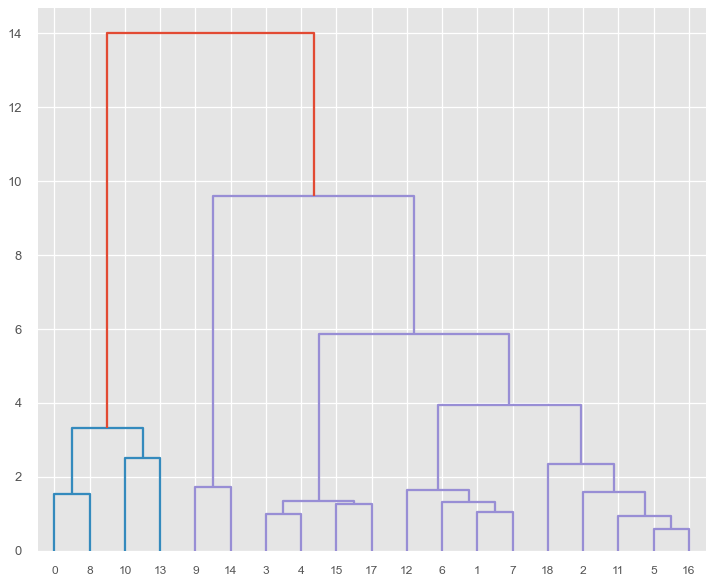

average :	0.00s


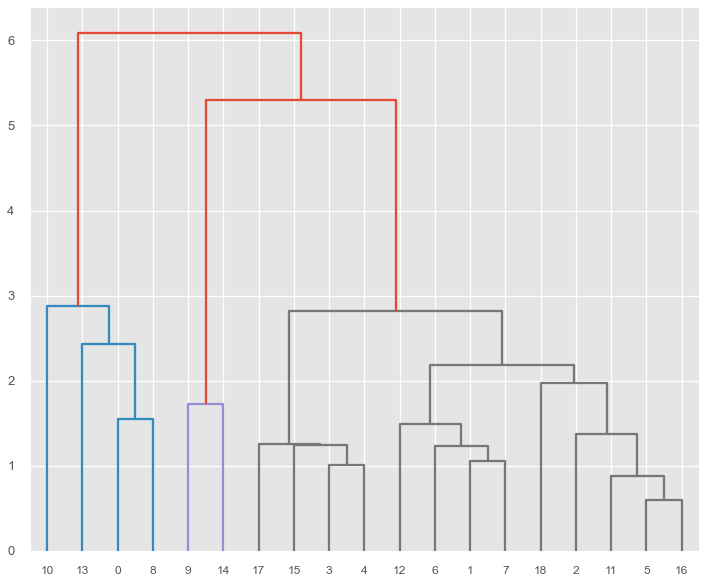

complete :	0.00s


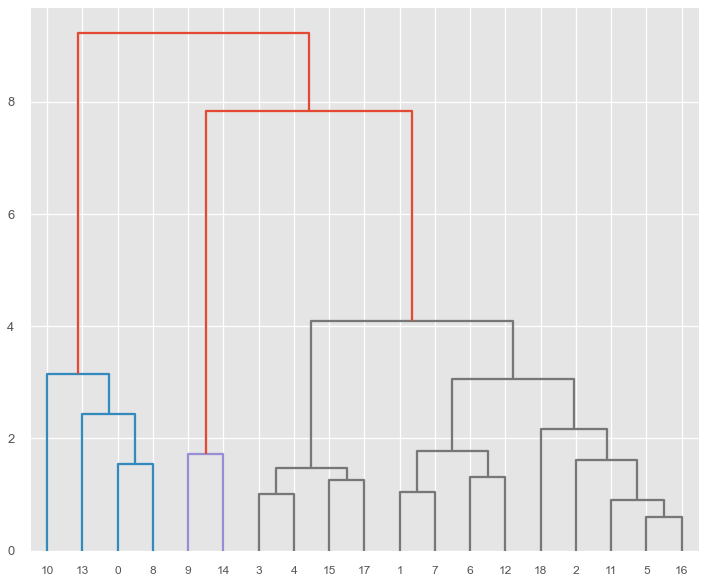

single :	0.01s


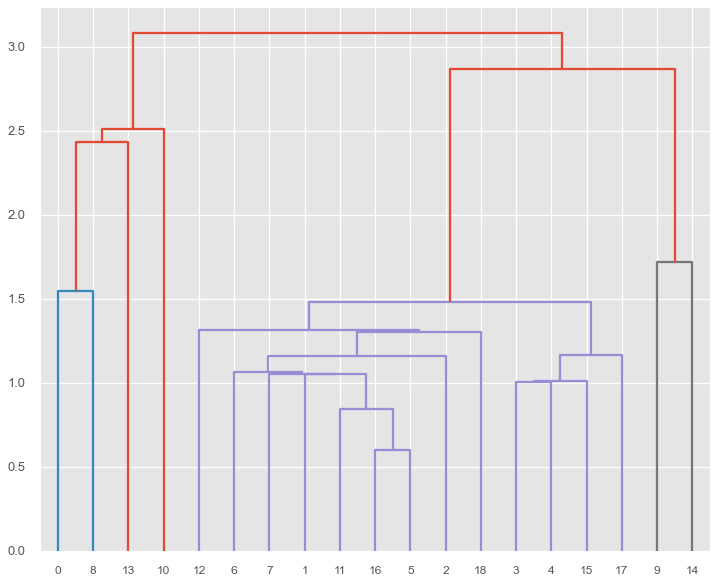

In [ ]:
for linkage in ("ward", "average", "complete", "single"):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=None,
                            distance_threshold = 0)
    t0 = time()
    clustering.fit(X_scaled)
    print("%s :\t%.2fs" % (linkage, time() - t0))

    plt.clf()
    funciones.plot_dendogram(clustering)
    #plot_clustering(X_scaled, clustering.labels_, "%s linkage" % linkage)


#plt.show()

Decidimos quedarnos con el método de mínima varianza de Ward ya que las alturas de corte parecen discriminar algo mejor a los grupos, decidimos quedarnos con 3.

Ajustamos un clustering jerárquico por el Linkage de Ward y 3 grupos. Extramos la clasificación propuesta en forma de vector de clase predicha y calculamos las dos métricas de evaluación en ambiente no supervisado: sieluta e índice de Calinski-Harabasz.

Como se trata de variables numéricas elegimos la distancia euclídea.

In [ ]:
modelo_hclust_ward = AgglomerativeClustering(
                            affinity = 'euclidean',
                            linkage  = 'ward',
                            n_clusters  = 3
                     )
modelo_hclust_ward.fit(X=X_scaled)

cluster_labels = modelo_hclust_ward.fit_predict(X_scaled)


In [ ]:
cluster_labels

array([1, 0, 0, 0, 0, 0, 0, 0, 1, 2, 1, 0, 0, 1, 2, 0, 0, 0, 0],
      dtype=int64)

**Silueta clustering Ward**



In [ ]:
silhouette_score(X_scaled, cluster_labels)

0.545423243504176

**Indice de Calinski-Harabasz clustering Ward**



In [ ]:
from sklearn import metrics
metrics.calinski_harabasz_score(X_scaled, cluster_labels)

25.092001705878992

En este punto visualizamos los resultados, nos interesa ver la agrupación propuesta por el algoritmo de clustering en el espacio original de las variables. Y así poder intuir los patrones de agrupación en base a las variables originales:

Proyectamos primero sobre dos variables que consideramos importantes como son población y porcentaje de abstención:

In [ ]:
import plotly.express as px
elecciones_data['cluster_kmeans'] = cluster_labels
fig = px.scatter(elecciones_data, x='Population',y='AbstentionPtge', color='cluster', text=elecciones_data.index)
fig.show()

Añadimos ahora a estas el número de inmuebles para poder proyectar en 3D:

In [ ]:
import plotly.express as px
elecciones_data['cluster'] = cluster_labels
fig = px.scatter_3d(elecciones_data, x='Population',y='AbstentionPtge', z='inmuebles', color='cluster', text=elecciones_data.index)
fig.show()

Vemos tres grupos bien diferenciados por lo que podemos intuir también la situación de los centroides. La distribución no nos sorprende: Ceuta y Melilla por una parte con los valores más bajos dentro de las tres variables; las grandes Cataluña y Madrid a las que se las ha unido las también importantes Andalucía y Comunidad Valenciana ya que las cuatro tienen una población muy alta y un número de inmuebles superior al resto; por último las demás se han agrupado juntas.

Calculamos estos centroides:

In [ ]:
from sklearn.neighbors import NearestCentroid

clf = NearestCentroid()
clf.fit(X_scaled, cluster_labels)
print(clf.centroids_)

[[-0.25740454 -0.42432112  0.39251823 -0.38823507 -0.40098748 -0.38762789
  -0.40003259 -0.40774285 -0.38347648 -0.38765959]
 [-0.35039113  0.32572305 -0.40579085  0.18118719  1.78675007  1.75569105
   1.7882726   1.79714593  1.75774132  1.77465576]
 [ 2.37391175  2.10664117 -1.73978681  2.16115357 -0.96708151 -0.99180082
  -0.97633339 -0.9439633  -1.02288553 -1.02952422]]


Ejecutamos el algoritmo K-means para ver la agrupación que nos propone para el conjunto de datos de CCAA.

En primer lugar, vamos a aplicar la función que hemos definido para graficar los screeplots en relación a las 3 métricas comentadas para valorar el número de grupos óptimo y comparar con los propuestos en el dendograma de ward.

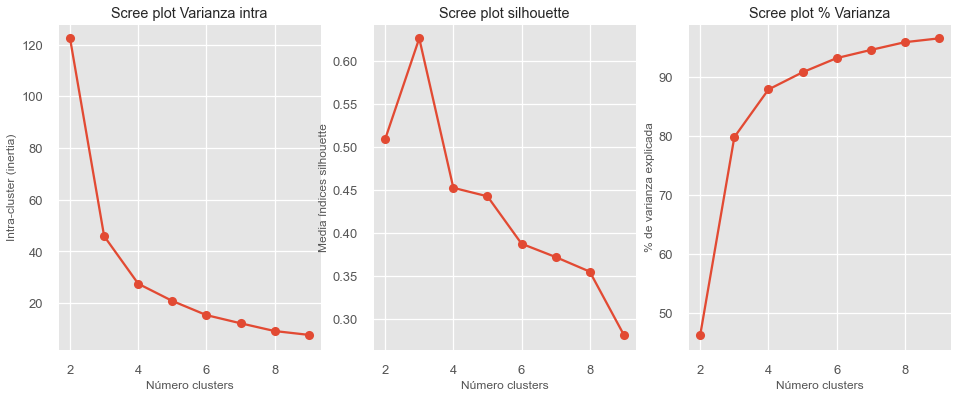

In [ ]:
funciones.scree_plot_kmeans(elecciones_data,10)
plt.show()

Vemos que 3 grupos es lo ideal también aquí, explicaríamos el 80% de la varianza.

Ajustamos el clustering Kmeans con 3 grupos para extraer resultados y conclusiones:

In [ ]:
modelo_kmeans = KMeans(n_clusters=3, n_init=25, random_state=123)
modelo_kmeans.fit(X=X_scaled)

KMeans(n_clusters=3, n_init=25, random_state=123)

In [ ]:
print('Varianza intra: ' + str(modelo_kmeans.inertia_))

Varianza intra: 45.9325493063166


In [ ]:
print('Centroides')
print(modelo_kmeans.cluster_centers_)

Centroides
[[-0.35039113  0.32572305 -0.40579085  0.18118719  1.78675007  1.75569105
   1.7882726   1.79714593  1.75774132  1.77465576]
 [-0.25740454 -0.42432112  0.39251823 -0.38823507 -0.40098748 -0.38762789
  -0.40003259 -0.40774285 -0.38347648 -0.38765959]
 [ 2.37391175  2.10664117 -1.73978681  2.16115357 -0.96708151 -0.99180082
  -0.97633339 -0.9439633  -1.02288553 -1.02952422]]


In [ ]:
print('Etiquetas')
modelo_kmeans.labels_[:5]

Etiquetas


array([0, 1, 1, 1, 1])

Vemos ahora las métricas de silueta e Índice de Calinski Harabasz:

In [ ]:
cluster_labels = modelo_kmeans.labels_
silhouette_score(X_scaled, cluster_labels)

0.545423243504176

In [ ]:
metrics.calinski_harabasz_score(X_scaled, cluster_labels)

25.092001705878992

Ahora realizamos un análisis clúster comparando el método Ward con Kmeans:

In [ ]:
elecciones_data[elecciones_data.cluster != elecciones_data.cluster_kmeans]

,AbstentionPtge,Age_under19_Ptge,Age_over65_pct,PobChange_pct,Population,TotalCensus,Pob2010,totalEmpresas,Industria,inmuebles,cluster_kmeans,cluster
CCAA,,,,,,,,,,,,


No obtenemos ninguna observación que haya sido considerada en clusters diferentes mediante los dos métodos.

In [ ]:
pd.crosstab(elecciones_data.cluster,elecciones_data.cluster_kmeans)

cluster_kmeans,0,1,2
cluster,,,
0,13,0,0
1,0,4,0
2,0,0,2


En la tabla de correspondencia vemos que cuadran a la perfección todas las observaciones.

In [ ]:
elecciones_data[(elecciones_data.cluster == 0) & (elecciones_data.cluster_kmeans != 1)]

,AbstentionPtge,Age_under19_Ptge,Age_over65_pct,PobChange_pct,Population,TotalCensus,Pob2010,totalEmpresas,Industria,inmuebles,cluster_kmeans,cluster
CCAA,,,,,,,,,,,,
Aragón,25.033557,11.171264,33.307423,-6.309685,1317847,984289,1347095.0,90048.0,5630.0,781939.0,0,0
Asturias,33.762987,11.563526,29.810372,-5.716538,1051229,872130,1084341.0,67674.0,3346.0,654820.0,0,0
Baleares,33.574701,19.773448,17.805015,-0.539104,1104479,749065,1106049.0,89341.0,4407.0,610394.0,0,0
Canarias,34.843398,17.961705,17.617239,-2.417045,2100306,1535589,2118519.0,135909.0,5017.0,1058501.0,0,0
Cantabria,26.880235,14.450471,24.182500,-1.560686,585179,462697,592250.0,37692.0,1934.0,375521.0,0,0
CastillaLeón,23.822925,8.723355,36.713069,-7.552451,2472052,1990607,2559515.0,160390.0,8715.0,1647086.0,0,0
CastillaMancha,22.698995,12.399628,32.234108,-8.291893,2059191,1540063,2098373.0,126143.0,10850.0,1277457.0,0,0
Extremadura,26.541096,14.409016,28.283207,-4.072260,1092161,880546,1107220.0,65281.0,4239.0,650913.0,0,0
Galicia,30.870268,11.653592,32.356656,-6.746486,2732347,2257941,2792246.0,197234.0,12165.0,1673192.0,0,0


In [ ]:
elecciones_data[(elecciones_data.cluster == 1) & (elecciones_data.cluster_kmeans != 0)]

,AbstentionPtge,Age_under19_Ptge,Age_over65_pct,PobChange_pct,Population,TotalCensus,Pob2010,totalEmpresas,Industria,inmuebles,cluster_kmeans,cluster
CCAA,,,,,,,,,,,,
Andalucía,28.702028,18.304943,20.938508,-2.588117,8393616,6279879,8370975.0,489236.0,26208.0,4445413.0,1,1
Cataluña,34.286721,18.674294,21.316567,-1.313171,7508106,5313563,7512381.0,596172.0,34072.0,3936528.0,1,1
ComValenciana,21.888273,16.338419,24.188871,-3.714723,4980689,3519941,5111706.0,344518.0,23305.0,3268839.0,1,1
Madrid,25.072363,21.340352,15.980966,3.305363,6436996,4662855,6458684.0,516402.0,22170.0,3014471.0,1,1
